# P3 Milestone

## Was Maslow's Hierarchy of Needs dismantled during the COVID-19 pandemic?
Maslow's Hierarchy of Needs serves as a model for assessing human behavior. We clearly
observed a shift in behavior during the pandemic. Now, we must ask: were the blocks of the
pyramid also rearranged? By analyzing the mobility report alongside Wikipedia searches, we
aim to explore whether the hierarchy of needs remains unchanged or if it needs redefinition. We
will also try to draw a link between the blocks of the pyramid and the mobility patterns. For
example, groceries and pharmacy represent physiological needs, safety needs may include
residential or job security, love and belonging could be related to relationships and
transportation to see loved ones, and esteem can be associated with employment, and
self-actualization. Self-actualization, at the top of Maslow's Hierarchy, involves personal and
professional growth, creativity, and a deeper sense of purpose. This process may lead to a
renewed appreciation for Maslow's work or reveal new insights into human motivation during
these unique times.

![Image Alt Text](maslow.jpg)

In [55]:
%reload_ext autoreload
%autoreload 2

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.stats as stats
from helpers import *
import plotly.express as px
from datetime import datetime
import statsmodels.formula.api as smf
from sklearn.linear_model import LinearRegression
import plotly.graph_objects as go

## General Description of the Notebook

For this milestone, we will be going through the provided datasets, analyzing them in different ways in order to see if they can give us an insight on whether there is a shift in the importance of some of the pyramid's sections. We will be also be using other external datasets in order to not only enhance the analysis of the provided datasets, but also to add more information relative to our topic. 

## Regions Dataframe (External Dataset)

This is an additional dataset containing countries with their region code, and the continent that they're located in. This dataset has been added in order to associate country region codes in the other datasets to their respective ccontinents. This is particularly useful in order to have more readable graphs in our anlysis.

We start off by keeping only the columns that we need using the '.loc' method. The columns that we are keeping are the countries' names, their corresponding continent (i.e. 'region') as well as their 'alpha-2' region code.

In [114]:
dfRegions=pd.read_csv('DATA/regions.csv')

# Keeping only the columns that we are interested in
dfRegions = dfRegions.loc[:,['name', 'region', 'alpha-2']]
dfRegions

,name,region,alpha-2
0,Afghanistan,Asia,AF
1,Åland Islands,Europe,AX
2,Albania,Europe,AL
3,Algeria,Africa,DZ
4,American Samoa,Oceania,AS
...,...,...,...
244,Wallis and Futuna,Oceania,WF
245,Western Sahara,Africa,EH
246,Yemen,Asia,YE
247,Zambia,Africa,ZM


Splitting the previous dataframe into multiple dataframes, each corresponding to a specififc continent.

In [115]:
# Creating a list of all possible continents
continents = dfRegions['region'].unique()

# Removing the last element of the 'continents' array, since it's a 'nan' value corresponding to antartica, 
# which can be discarded from our analysis
continents = continents[:-1]

# Creating an array of dataframes, each corresponding to a subset of the previous dataframe containing 
# countries from only one continent
dfsContinents = []
for continent in continents :
    dfsContinents.append(dfRegions[dfRegions['region'] == continent].copy())


## Interventions 

This dataset contains the dates of different types of interventions (Lockdown, public events closure, etc.) for different countries. We will show when these events occur for each of these countries, and then use this information in the analysis of other datasets.

In [116]:
interventions=pd.read_csv('DATA/interventions.csv')
interventions=process_interventions(interventions)
interventions.dtypes
interventions

,lang,1st case,1st death,School closure,Public events banned,Lockdown,Mobility,Normalcy
0,fr,2020-01-24,2020-02-14,2020-03-14,2020-03-13,2020-03-17,2020-03-16,2020-07-02
1,da,2020-02-27,2020-03-12,2020-03-13,2020-03-12,2020-03-18,2020-03-11,2020-06-05
2,de,2020-01-27,2020-03-09,2020-03-14,2020-03-22,2020-03-22,2020-03-16,2020-07-10
3,it,2020-01-31,2020-02-22,2020-03-05,2020-03-09,2020-03-11,2020-03-11,2020-06-26
4,nl,2020-02-27,2020-03-06,2020-03-11,2020-03-24,NaT,2020-03-16,2020-05-29
5,no,2020-02-26,2020-02-26,2020-03-13,2020-03-12,2020-03-24,2020-03-11,2020-06-04
6,sr,2020-03-06,2020-03-20,2020-03-15,2020-03-21,2020-03-21,2020-03-16,2020-05-02
7,sv,2020-01-31,2020-03-11,2020-03-18,2020-03-12,NaT,2020-03-11,2020-06-05
8,ko,2020-01-20,2020-02-20,2020-02-23,NaT,NaT,2020-02-25,2020-04-15
9,ca,2020-01-31,2020-02-13,2020-03-12,2020-03-08,2020-03-14,2020-03-16,NaT


Converting the data of the interventions dataframe into the proper format in order to correctly plot it.

In [117]:
interventions['Lockdown'] = pd.to_datetime(interventions['Lockdown'], format='%Y-%m-%d')
interventions['Public events banned'] = pd.to_datetime(interventions['Public events banned'], format='%Y-%m-%d')
interventions['Mobility'] = pd.to_datetime(interventions['Mobility'], format='%Y-%m-%d')

Creating a scatter plot containing the dates of different interventions of different countries.

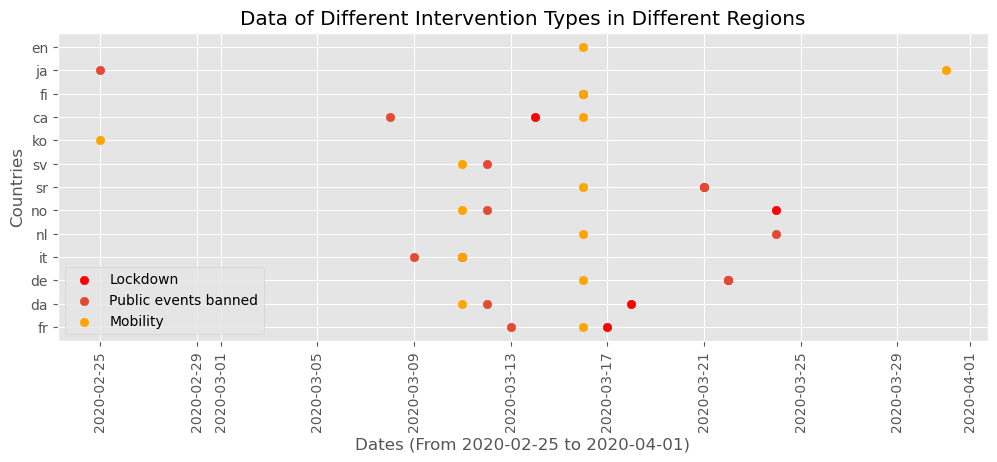

In [118]:
# Setting figure size
plt.figure(figsize=(12,4))

# Creating multiple scatter plots with the y values being the 'lang' (i.e. countries) column and the x values being different interventions
# type (Lockdown, Public events being banned and Mobility Limitations)
plt.scatter(interventions['Lockdown'],interventions['lang'],color='red',label='Lockdown')
plt.scatter(interventions['Public events banned'],interventions['lang'],label='Public events banned')
plt.scatter(interventions['Mobility'],interventions['lang'],color='orange',label='Mobility')

plt.legend()
plt.xticks(rotation=90)
plt.xlabel('Dates (From 2020-02-25 to 2020-04-01)')
plt.ylabel('Countries')
plt.title('Data of Different Intervention Types in Different Regions')
plt.show()


## Topics linked

This dataset gives us the number of pageviews per topic. The four main topics are culture, history, geography and STEM. This gives us an initial idea of what people are generally interested in researching, which can help us understand which sections of Maslow's Hierarchy are more important than others.

First we preprocess our dataset, particularly by converting each 'False' value to 0 and each 'True' value to 1.

In [119]:
#Laod the topics and pre-process the topics_linked dataset
topics_linked=pd.read_csv('DATA/topics_linked.csv')
topics_linked=process_topics_linked(topics_linked)
topics_linked

,index,Geography.Regions.Asia.Central Asia,Geography.Regions.Europe.Eastern Europe,History and Society.Military and warfare,Culture.Media.Television,History and Society.Education,Culture.Media.Books,Geography.Regions.Africa.Africa*,Culture.Visual arts.Architecture,Culture.Biography.Women,...,Geography.Regions.Asia.West Asia,STEM.Chemistry,Geography.Regions.Europe.Northern Europe,Culture.Media.Video games,Geography.Regions.Asia.Southeast Asia,Culture.Media.Entertainment,Culture.Media.Music,Geography.Regions.Asia.Asia*,Geography.Regions.Asia.North Asia,qid
0,Rosmalen,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,Q2001490
1,Commelinales,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,Q290349
2,Transport_in_Honduras,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,Q1130638
3,QuakeC,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,Q2122062
4,Food_writing,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,Q5465542
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4306121,Faimaala_Filipo,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,Q84090991
4306122,Jonathan_Horne,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,Q1666264
4306123,Steven_Da_Costa,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,Q22921600
4306124,The_Silence_of_Dr._Evans,0,1,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,Q4301095


Instead of keeping track of each sub-genre with a particular topic, we decide to reduce the dataframe into a simpler one, containing the total number of pageviews for each column (and thus for each topic) by summing up all the values in a column for each column. This done through the 'sum()' method. We then sort the values within the dataframe in descending order using the 'sort_values()' method.

In [120]:
topics_agg=topics_linked.select_dtypes(include='int').sum().copy()
topics_agg=topics_agg.sort_values(ascending=False)
topics_agg

Culture.Biography.Biography*                1403864
Geography.Regions.Europe.Europe*            1008804
Culture.Media.Media*                         817879
Culture.Sports                               739892
Geography.Regions.Americas.North America     703802
                                             ...   
Geography.Regions.Africa.Western Africa       12143
Geography.Regions.Asia.Central Asia           10441
STEM.Libraries & Information                   8814
Geography.Regions.Africa.Eastern Africa        7192
Geography.Regions.Africa.Central Africa        4301
Length: 64, dtype: int64

In [121]:
topics_agg.describe()

count    6.400000e+01
mean     1.824276e+05
std      2.651203e+05
min      4.301000e+03
25%      3.186950e+04
50%      8.563600e+04
75%      1.809262e+05
max      1.403864e+06
dtype: float64

Creating a barplot in order to view the number of page searches per topic.

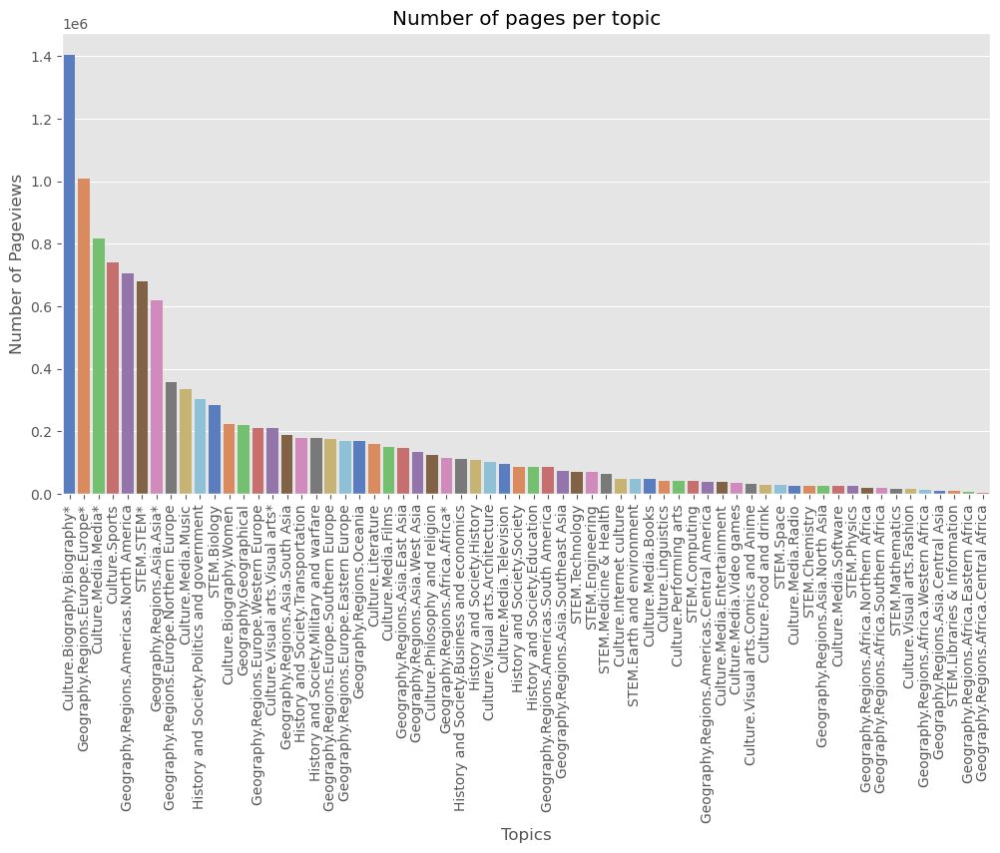

In [122]:
plt.figure(figsize=(12,6))
sns.barplot(x=topics_agg.index, y=topics_agg, palette='muted')
plt.xticks(rotation=90)
plt.title('Number of pages per topic')
plt.xlabel('Topics')
plt.ylabel('Number of Pageviews')
plt.show()

Creating an array of the different main groups of topic (Culture, History, ...)

In [123]:
topics_groups = ['Culture', 'Geography', 'History', 'STEM']

Splitting the "topics_agg" dataframe into multiple dataframes, each corresponding to a specific topic group and storing them in the array "dfsTopics".

In [124]:
dfsTopics = [] 
for topic in topics_groups :
    dfsTopics.append(topics_agg[topics_agg.index.str.contains(topic)].copy())

Creating multiple barplots, based on the main topic group.

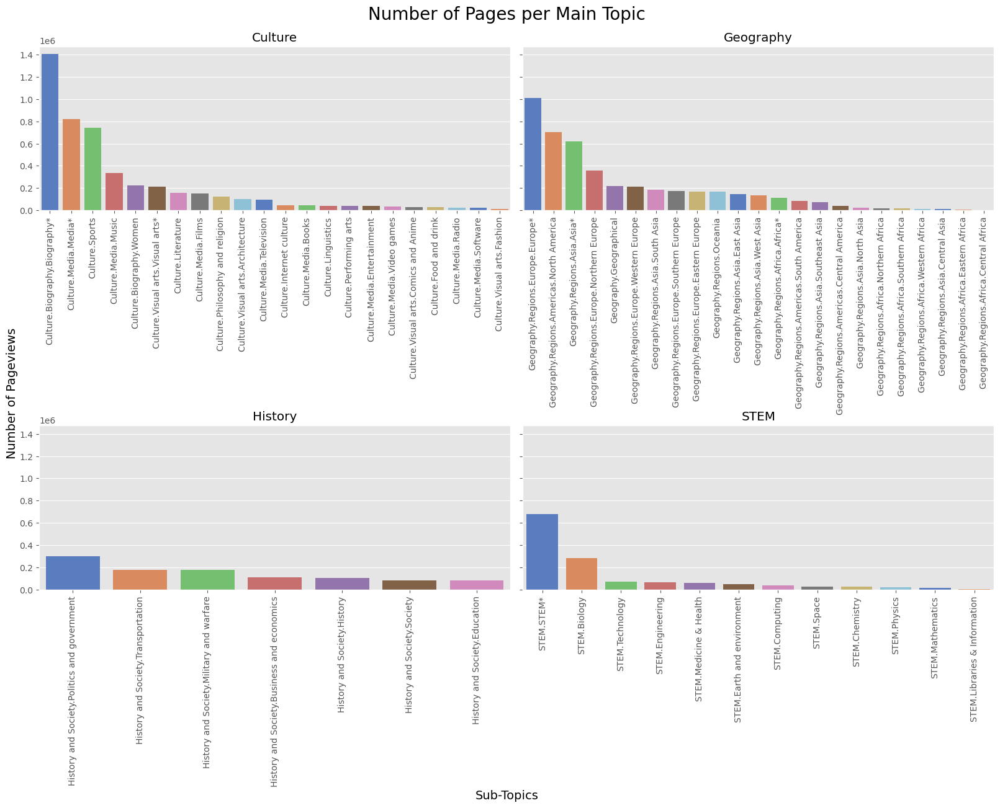

In [125]:
# Figure is 2x2 in order to have 4 different plots, for each main topic (Culture, Geography, STEM and History)
fig, axs= plt.subplots(2,2,sharey=True,sharex=False,figsize=(16,13))
for i, dfTopic in enumerate(dfsTopics) :
    # Proper conversion of i (goes from 0 to 3) into "matrix" indices for axs variable
    ax = axs[i//2][i%2]
    sns.barplot(x=dfTopic.index, y=dfTopic, palette='muted', ax=ax)
    ax.set_xticklabels(dfTopic.index, rotation=90)
    ax.set_title(topics_groups[i])


plt.tight_layout()

# Adding x and y axis titles 
fig.text(0.5, 0.00000005, 'Sub-Topics', ha='center', va='center', fontsize=14)
fig.text(0.002, 0.5, 'Number of Pageviews',
         ha='center', va='center', rotation='vertical', fontsize=14)

# Fine-tune layout to create more space at the top
plt.subplots_adjust(top=0.93)

# Adding figure title
plt.suptitle('Number of Pages per Main Topic', fontsize=20)
plt.show()

## Aggregated Time Series

The Aggregated Time Series dataset contains the number of wikipedia pageviews per topic, arranged by country, through a time interval between 2018 and 2020 (recorded daily). This means that we can observe the evolution of people's interests, and see whether some interests have become more important than others.

In [73]:
agg_ts=pd.read_json('DATA/aggregated_timeseries.json')
agg_ts


,ja.m,it,da.m,tr,no.m,en,sr,tr.m,en.m,no,...,ko.m,fi.m,sr.m,ja,fr,fi,ca,it.m,sv.m,ko
len,1197788,1594039,256451,346007,516838,6047509,632128,345790,6045654,531478,...,489181,480638,396063,1197856,2195949,481854,642031,1588312,1959446,490314
sum,"{'2018-01-01 00:00:00': 22328288, '2018-01-02 ...","{'2018-01-01 00:00:00': 3338750, '2018-01-02 0...","{'2018-01-01 00:00:00': 765123, '2018-01-02 00...","{'2018-01-01 00:00:00': 407629, '2018-01-02 00...","{'2018-01-01 00:00:00': 715031, '2018-01-02 00...","{'2018-01-01 00:00:00': 86763830, '2018-01-02 ...","{'2018-01-01 00:00:00': 192409, '2018-01-02 00...","{'2018-01-01 00:00:00': 493684, '2018-01-02 00...","{'2018-01-01 00:00:00': 135822131, '2018-01-02...","{'2018-01-01 00:00:00': 224417, '2018-01-02 00...",...,"{'2018-01-01 00:00:00': 1484496, '2018-01-02 0...","{'2018-01-01 00:00:00': 1319053, '2018-01-02 0...","{'2018-01-01 00:00:00': 451383, '2018-01-02 00...","{'2018-01-01 00:00:00': 7828155, '2018-01-02 0...","{'2018-01-01 00:00:00': 6441009, '2018-01-02 0...","{'2018-01-01 00:00:00': 523135, '2018-01-02 00...","{'2018-01-01 00:00:00': 111910, '2018-01-02 00...","{'2018-01-01 00:00:00': 12856884, '2018-01-02 ...","{'2018-01-01 00:00:00': 2383474, '2018-01-02 0...","{'2018-01-01 00:00:00': 819174, '2018-01-02 00..."
covid,"{'len': 30, 'sum': {'2018-01-01 00:00:00': 55,...","{'len': 33, 'sum': {'2018-01-01 00:00:00': 50,...","{'len': 4, 'sum': {'2018-01-01 00:00:00': 0, '...","{'len': 64, 'sum': {'2018-01-01 00:00:00': 1, ...","{'len': 10, 'sum': {'2018-01-01 00:00:00': 7, ...","{'len': 306, 'sum': {'2018-01-01 00:00:00': 57...","{'len': 9, 'sum': {'2018-01-01 00:00:00': 6, '...","{'len': 64, 'sum': {'2018-01-01 00:00:00': 3, ...","{'len': 306, 'sum': {'2018-01-01 00:00:00': 91...","{'len': 10, 'sum': {'2018-01-01 00:00:00': 2, ...",...,"{'len': 113, 'sum': {'2018-01-01 00:00:00': 6,...","{'len': 9, 'sum': {'2018-01-01 00:00:00': 0, '...","{'len': 9, 'sum': {'2018-01-01 00:00:00': 11, ...","{'len': 30, 'sum': {'2018-01-01 00:00:00': 26,...","{'len': 16, 'sum': {'2018-01-01 00:00:00': 62,...","{'len': 9, 'sum': {'2018-01-01 00:00:00': 2, '...","{'len': 49, 'sum': {'2018-01-01 00:00:00': 6, ...","{'len': 33, 'sum': {'2018-01-01 00:00:00': 139...","{'len': 8, 'sum': {'2018-01-01 00:00:00': 19, ...","{'len': 113, 'sum': {'2018-01-01 00:00:00': 3,..."
topics,{'Culture.Biography.Biography*': {'len': 14904...,{'Culture.Biography.Biography*': {'len': 29427...,{'Culture.Biography.Biography*': {'len': 57720...,{'Culture.Biography.Biography*': {'len': 70443...,{'Culture.Biography.Biography*': {'len': 11603...,{'Culture.Biography.Biography*': {'len': 14038...,{'Culture.Biography.Biography*': {'len': 37718...,{'Culture.Biography.Biography*': {'len': 70434...,{'Culture.Biography.Biography*': {'len': 14038...,{'Culture.Biography.Biography*': {'len': 11804...,...,{'Culture.Biography.Biography*': {'len': 75406...,{'Culture.Biography.Biography*': {'len': 10422...,{'Culture.Biography.Biography*': {'len': 37580...,{'Culture.Biography.Biography*': {'len': 14904...,{'Culture.Biography.Biography*': {'len': 38258...,{'Culture.Biography.Biography*': {'len': 10444...,{'Culture.Biography.Biography*': {'len': 10175...,{'Culture.Biography.Biography*': {'len': 29422...,{'Culture.Biography.Biography*': {'len': 14668...,{'Culture.Biography.Biography*': {'len': 75498...


#### Naive look at different topics: case Italy

DESCRIPTION OF PROCESS FUNCTION FOR AGGREGATE TIME SERIES + GENERAL DESCRIPTION OF THE DATASET

General Case : Average of Multiple Topics

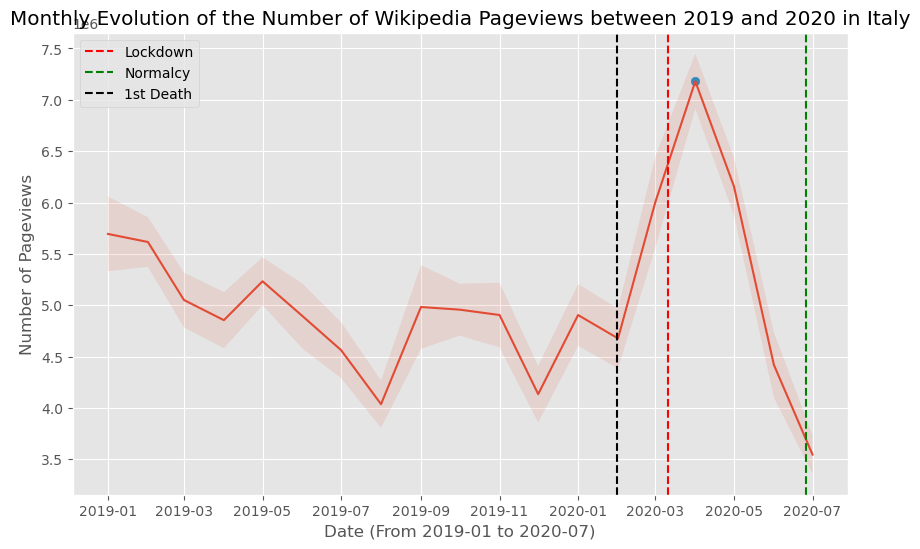

In [74]:
# Collecting only data from the Italy ("it") column and the "sum" row to collect the number of wikipedia page visits 
# (not topic specific). Then the dataframe is processed using the procees_agg_time_series() function. Finally, We only
# keep the data that corresponds to dates from 2019 to 2020 (in order to have a pre-pandemic and post-pandemic analysis)
it=process_agg_time_series(agg_ts['it']['sum'])
it=it.loc[it['year'].isin([2020,2019])]

# Averaging over the topics over IDKKKK!!!! using the '.mean()' method in order to have a general view of 
# the wikipedia page visits.
it_means=it.groupby(['year','month'])['sum'].mean().copy()

# Computing the standard error of the mean in order to then create the confidence intervals
it_sem=it.groupby(['year','month'])['sum'].sem().copy()

# Setting the indices of the averages dataframe and the standard error of the mean dataframe to the specific datetimes
it_means.index=[datetime(e[0], e[1],1) for e in it_means.index]
it_sem.index=[datetime(e[0], e[1],1) for e in it_sem.index]

# Computing the 95% confidence intervals using the standard error of the mean
CI=stats.t.interval(0.95, len(it_means)-1 , loc = it_means, scale = it_sem)


# Creating the lineplot for the average number of wikipedia pageviews in Italy between 2019 and 2020. We will be using
# our finding from the "interventions" dataset in order to observe whether the sharp increases or dropoffs within these
# evolutions are in anyway related to these interventions.

# Setting a figure size 
plt.figure(figsize=(10,6))

# Creating a lineplot using the means dataframe
sns.lineplot(it_means)

# Creating 3 vertical lines, indicating the when the interventions (Lockdown, Normalcy and 1st Case)
plt.axvline(x=[interventions['Lockdown'][3]],color='red', linestyle='--', label='Lockdown')
plt.axvline(x=[interventions['Normalcy'][3]],color='green', linestyle='--', label='Normalcy')
plt.axvline(x=[interventions['1st case'][3]],color='black', linestyle='--', label='1st Death')

# Using the 'fill_between()' method in order the implement the previously computed confidence intervals
plt.fill_between(it_means.index,CI[0],CI[1],alpha=0.12)

# Showing where the maximum number of wikipedia page visits is
plt.scatter(x=it_means.idxmax(),y=it_means.max())
plt.title('Monthly Evolution of the Number of Wikipedia Pageviews between 2019 and 2020 in Italy')
plt.xlabel('Date (From 2019-01 to 2020-07)')
plt.ylabel('Number of Pageviews')
plt.legend()
plt.show()

Specific case : Viewing the evolution for multiple topics.

<Figure size 1400x600 with 0 Axes>

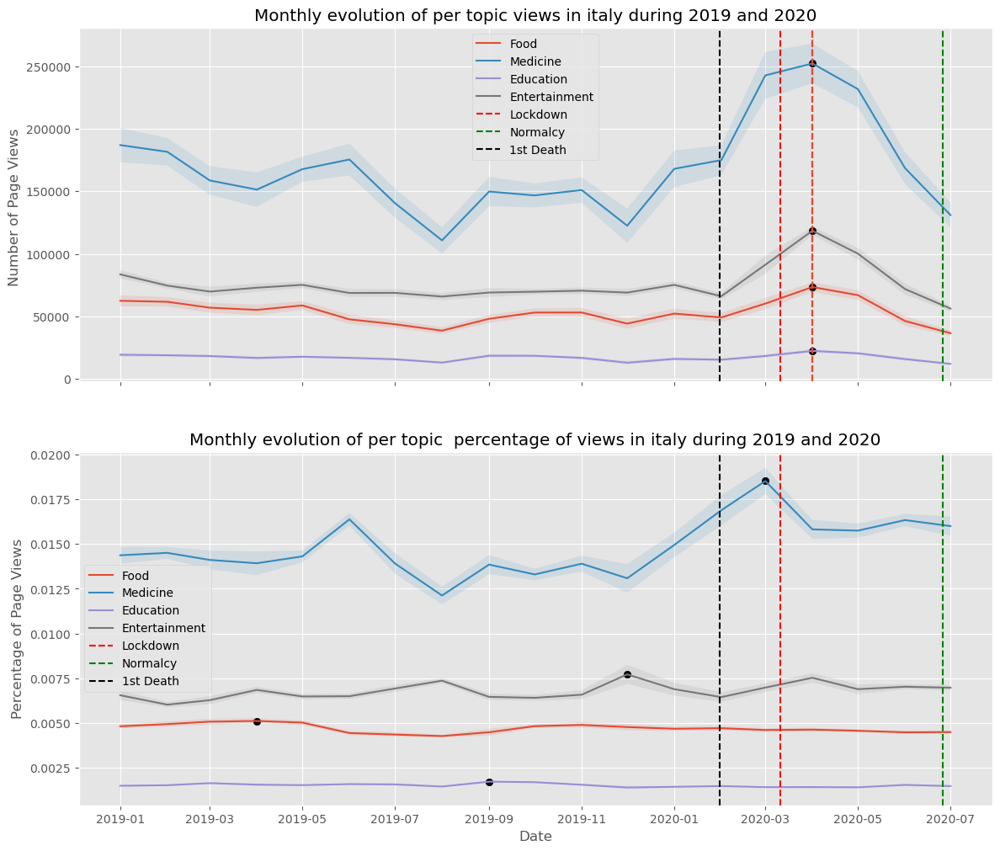

In [75]:
# Creating an array of dataframes, each correponding to a specific pageview topic. We will be viewing topics
# related to Food, Medicine, Education and Health
timeseries=[agg_ts['it']['topics']['Culture.Food and drink'],
    agg_ts['it']['topics']['STEM.Medicine & Health'],
    agg_ts['it']['topics']['History and Society.Education'],
    agg_ts['it']['topics']['Culture.Media.Entertainment']]

# Creating an array containing the different topics that are being studied
legends=['Food','Medicine','Education','Entertainment']

# Creating a figure containing the different plots.
plt.figure(figsize=(14,6))
fig,axs=plt.subplots(2,1,figsize=(14,12),sharex=True)

# Going through each individdual dataframe. A lineplot is created for each individual topic, and stacked into
# the same subplot.
for i,ts in enumerate(timeseries):
    
    # Processing each dataframe ts within the timeseries array using the 'process_agg_time_series()' 
    # function. Then, we only keep data that is relevant to the dates between 2019 and 2020
    df=process_agg_time_series(ts)
    df=df.loc[df['year'].isin([2020,2019])]
    
    # Averaging over IDKKKK!!!! over the different topics using the '.mean()' method in order to 
    # have a general view of the wikipedia page visits.
    df_means=df.groupby(['year','month'])['sum'].mean().copy()

    # Computing the standard error of the mean in order to then create the confidence intervals
    df_sem=df.groupby(['year','month'])['sum'].sem().copy()

    # Setting the indices of the averages dataframe and the standard error of the mean dataframe 
    # to the specific datetimes
    df_means.index=[datetime(e[0], e[1],1) for e in df_means.index]
    df_sem.index=[datetime(e[0], e[1],1) for e in df_sem.index]

    # Computing the 95% confidence intervals using the standard error of the mean
    CI=stats.t.interval(0.95, len(df_means)-1 , loc = df_means, scale = df_sem)

    # Creating a lineplot using the seaborn module
    sns.lineplot(df_means,label=legends[i],ax=axs[0])

    # Displaying the confidence intervals
    axs[0].fill_between(df_means.index,CI[0],CI[1],alpha=0.12)

    # Displaying the maximum number of page visits as a point and a vertical line
    axs[0].scatter(x=df_means.idxmax(),y=df_means.max(),color='black')
    axs[0].axvline(x=df_means.idxmax(), linestyle='--')

    # Adding a tile, x-axis and y-axis labels in the subplot
    axs[0].set_title('Monthly evolution of per topic views in italy during 2019 and 2020')
    axs[0].set_ylabel('Number of Page Views ')
    axs[0].set_xlabel('Dates')

    # Doing the same procedure for the previous subplot (means, standard error of the mean, 
    # 95% confidence intervals...), but instead of using the total number of wikipedia 
    # pageviews, we use the percentage values

    # Means
    df_means=df.groupby(['year','month'])['percent'].mean().copy()

    # Standard Error of the Mean
    df_sem=df.groupby(['year','month'])['percent'].sem().copy()

    # Indices Edit
    df_means.index=[datetime(e[0], e[1],1) for e in df_means.index]
    df_sem.index=[datetime(e[0], e[1],1) for e in df_sem.index]

    # Confidence Intervals
    CI=stats.t.interval(0.95, len(df_means)-1 , loc = df_means, scale = df_sem)

    # Lineplot
    sns.lineplot(df_means,label=legends[i],ax=axs[1])
    axs[1].fill_between(df_means.index,CI[0],CI[1],alpha=0.12)
    axs[1].scatter(x=df_means.idxmax(),y=df_means.max(),color='black')
    axs[1].set_title('Monthly evolution of per topic  percentage of views in italy during 2019 and 2020')
    axs[1].set_ylabel('Percentage of Page Views')   
    axs[1].set_xlabel('Date')    
    
# Creating 3 vertical lines, indicating the when the interventions (Lockdown, Normalcy and 1st Case),
# for eacch of the two subplots
for i in range(2):
    axs[i].axvline(x=[interventions['Lockdown'][3]],color='red', linestyle='--', label='Lockdown')
    axs[i].axvline(x=[interventions['Normalcy'][3]],color='green', linestyle='--', label='Normalcy')
    axs[i].axvline(x=[interventions['1st case'][3]],color='black', linestyle='--', label='1st Death')
    axs[i].legend()

plt.show()

#### Deeper look at how normalcy status affected the searches

##### General number of cases

###### Add  columns that specify the lockdown and normalcy status of italy (1 for lockdown/normalcy 0 otherwise)

To quantify our data, we would first like to correlate the state of lockdown, first death and normalcy to the number of wikipedia page visits. This can be achieved by changing the dataframe given by the aggregated time series, by adding indicator columns. e.g: if we're in a lockdown state mark the column as 1 and 0 otherwise. 

In [76]:
# Collecting the dates of different interventions in Italy
it_lockdown_date=interventions['Lockdown'][3]
it_normalcy_date=interventions['Normalcy'][3]
it_first_death=interventions['1st case'][3]

In [77]:
it=process_agg_time_series(agg_ts['it']['sum'])
it['Lockdown_status']= np.where(it['date']>=it_lockdown_date,1,0)
it['Normalcy_status']=np.where(it['date']>=it_normalcy_date,1,0)


Once this preprocessing is done, we can move the analysis. The first thing that can be done is a least squares regression in order to find the contributions of the lockdown and normalcy states.

In [78]:
model=smf.ols(formula='sum~C(Lockdown_status)+C(Normalcy_status)',data=it)
res=model.fit()
print(res.summary())

                            OLS Regression Results                            
Dep. Variable:                    sum   R-squared:                       0.200
Model:                            OLS   Adj. R-squared:                  0.199
Method:                 Least Squares   F-statistic:                     117.7
Date:                Fri, 22 Dec 2023   Prob (F-statistic):           2.38e-46
Time:                        14:26:35   Log-Likelihood:                -14329.
No. Observations:                 943   AIC:                         2.866e+04
Df Residuals:                     940   BIC:                         2.868e+04
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
                              coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------
Intercept                4

###### Interpretation:
This shows that during lockdown times, the total number of visits for italian wikipedia pages increases by approximately  1.2 million and decreases by approximately 2.7 million 
when normalcy is restored

We test the hypotheses to  show our results


In [79]:
#Aggregate the data into during and out of lockdown.
it_sum_death=it.groupby('Lockdown_status')['sum'].apply(lambda x: x.values).copy()

#Perform the t test to determine the p value
t_stat_total_view, p_val_total_view=stats.ttest_ind(it_sum_death[1],it_sum_death[0],alternative='greater')

print(f'The p-value for null hypothesis the number of views before lockdown is similar to the number of views during lockdown is: {p_val_total_view}')



The p-value for null hypothesis the number of views before lockdown is similar to the number of views during lockdown is: 5.47646312361425e-08


This gives strong statistical proof that the alternative hypothesis: total views during lockdown is greater that the total views before.

This result can be visualised with the graph below.

C:\Users\Kamal\AppData\Local\Temp\ipykernel_33988\2092784700.py:6: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_2019=it.loc[it['year']==2019][it['month'].isin(df_2020.index)].groupby('month')['sum'].mean().copy()
C:\Users\Kamal\AppData\Local\Temp\ipykernel_33988\2092784700.py:7: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_2018=it.loc[it['year']==2018][it['month'].isin(df_2020.index)].groupby('month')['sum'].mean().copy()


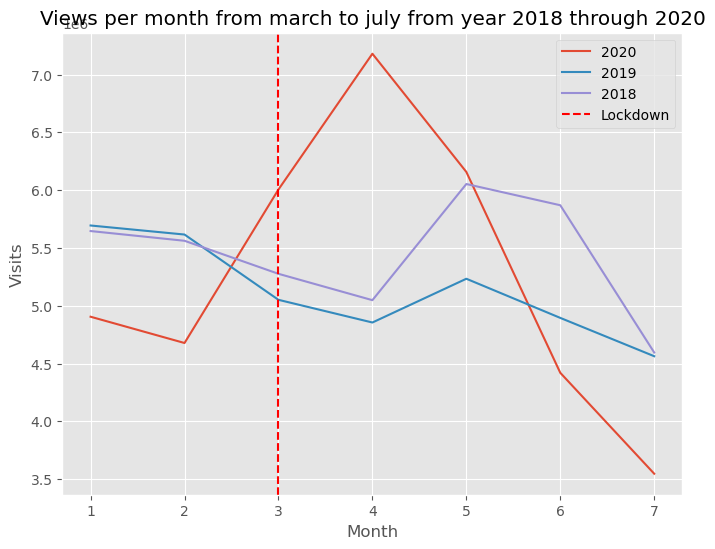

In [80]:
#Create a dataframe from the 2020 data and aggregate to obtain the mean number of views per month.
df_2020=it.loc[it['year']==2020].groupby('month')['sum'].mean().copy()

#Given that the 2020 data has months going from january to july only, select this time period for 2019 and 2018.
#Aggregate the same way that was done for 2020 
df_2019=it.loc[it['year']==2019][it['month'].isin(df_2020.index)].groupby('month')['sum'].mean().copy()
df_2018=it.loc[it['year']==2018][it['month'].isin(df_2020.index)].groupby('month')['sum'].mean().copy()

#PLot the three lines that represent the number of views per months for each year
plt.figure(figsize=(8,6))
sns.lineplot(df_2020,label='2020')
sns.lineplot(df_2019,label='2019')
sns.lineplot(df_2018,label='2018')

#To show lockdown state, draw a line at march, the month where lockdown happened.
plt.axvline(x=it_lockdown_date.month,color='red', linestyle='--', label='Lockdown')

#Legend and label the plot.
plt.legend()
plt.xlabel('Month')
plt.ylabel('Visits')
plt.title('Views per month from march to july from year 2018 through 2020')
plt.show()

##### Specific case (e.g: food and drink)

We can now proceed the same way for the specific case of food and drinks

In [81]:
#Construct the dataframe witht the indicator columns
food_drink=process_agg_time_series(agg_ts['it']['topics']['Culture.Food and drink'])
food_drink['Lockdown_status']= np.where(food_drink['date']>=it_lockdown_date,1,0)
food_drink['Normalcy_status']=np.where(food_drink['date']>=it_normalcy_date,1,0)
food_drink['Death_status']=np.where(food_drink['date']>=it_first_death,1,0)

In [82]:
# Fit the least squares models that depends on the Lockdown_status and Normalcy_status Variables
model=smf.ols(formula='sum~C(Lockdown_status)+C(Normalcy_status)',data=food_drink)
res=model.fit()
print(res.summary())

                            OLS Regression Results                            
Dep. Variable:                    sum   R-squared:                       0.117
Model:                            OLS   Adj. R-squared:                  0.115
Method:                 Least Squares   F-statistic:                     62.23
Date:                Fri, 22 Dec 2023   Prob (F-statistic):           4.16e-26
Time:                        14:26:37   Log-Likelihood:                -10270.
No. Observations:                 943   AIC:                         2.055e+04
Df Residuals:                     940   BIC:                         2.056e+04
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
                              coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------
Intercept                5

###### Interpretation:
This shows that during lockdown times, the total number of visits for italian wikipedia pages related to food and drinks increases by approximately 8530 and decreases by approximately 28000 when normalcy is restored.

Visualizing and computing the values 

C:\Users\Kamal\AppData\Local\Temp\ipykernel_33988\324840953.py:6: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_2019=food_drink.loc[food_drink['year']==2019][food_drink['month'].isin(df_2020.index)].groupby('month')['sum'].mean().copy()
C:\Users\Kamal\AppData\Local\Temp\ipykernel_33988\324840953.py:7: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_2018=food_drink.loc[food_drink['year']==2018][food_drink['month'].isin(df_2020.index)].groupby('month')['sum'].mean().copy()


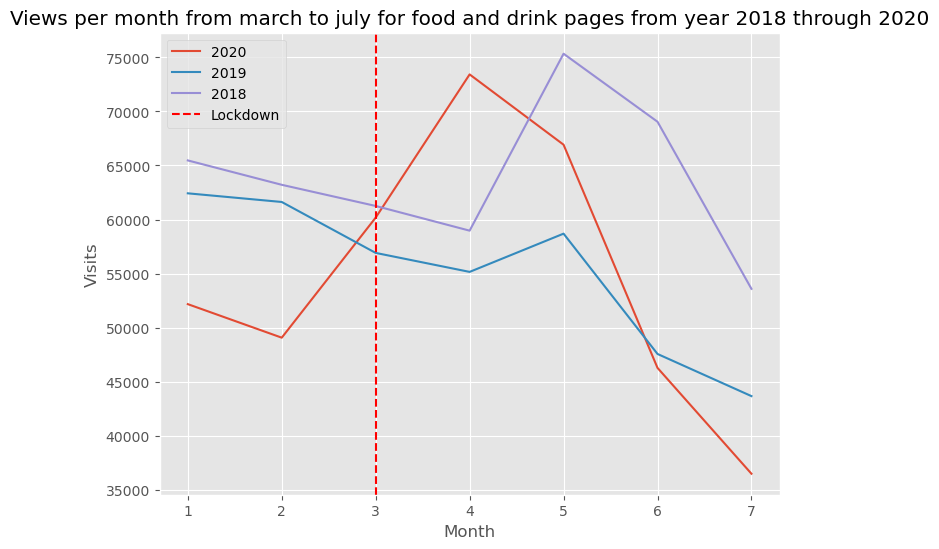

In [83]:
#Create a dataframe from the 2020 data and aggregate to obtain the mean number of views per month.
df_2020=food_drink.loc[food_drink['year']==2020].groupby('month')['sum'].mean().copy()

#Given that the 2020 data has months going from january to july only, select this time period for 2019 and 2018.
#Aggregate the same way that was done for 2020 
df_2019=food_drink.loc[food_drink['year']==2019][food_drink['month'].isin(df_2020.index)].groupby('month')['sum'].mean().copy()
df_2018=food_drink.loc[food_drink['year']==2018][food_drink['month'].isin(df_2020.index)].groupby('month')['sum'].mean().copy()

#PLot the three lines that represent the number of views per months for each year
plt.figure(figsize=(8,6))
sns.lineplot(df_2020,label='2020')
sns.lineplot(df_2019,label='2019')
sns.lineplot(df_2018,label='2018')

#To show lockdown state, draw a line at march, the month where lockdown happened.
plt.axvline(x=it_lockdown_date.month,color='red', linestyle='--', label='Lockdown')

#Legend and label the plot.
plt.legend()
plt.xlabel('Month')
plt.ylabel('Visits')
plt.title('Views per month from march to july for food and drink pages from year 2018 through 2020')
plt.show()

Looking at the graph and at the computed means, we can say that our theory for overall number of views also applies to food and drink related topics.

Let's proceed similarly for the Medicine, Education and Entertainment topics:

In [84]:
for i in range(1, len(timeseries)):
    ts=timeseries[i]
    topic=legends[i]
    df=process_agg_time_series(ts)
    df['Lockdown_status']= np.where(df['date']>=it_lockdown_date,1,0)
    mean=df.groupby('Lockdown_status')['sum'].mean()
    print(f'The average of page visits during for {topic} pages is {mean[0]} per day before lockdown, compared to {mean[1]} during lockdown.')

The average of page visits during for Medicine pages is 167601.35375 per day before lockdown, compared to 206349.04195804195 during lockdown.
The average of page visits during for Education pages is 16607.54125 per day before lockdown, compared to 17912.986013986014 during lockdown.
The average of page visits during for Entertainment pages is 75308.57 per day before lockdown, compared to 88700.46153846153 during lockdown.


This also backs our initial claim: views have boosted during lockdown.

## Google Mobility Report

This dataset contains the relative percentage change from baseline of different domains (such as retail and recreation), recorded daily from 2020-02-15 to 2020-08-25, for different countries. This another oopurtunity for us to observe the impact that covid has had over the interests of pindividuals.

In [85]:
global_mr=pd.read_csv('DATA/Global_Mobility_Report.csv')
global_mr

C:\Users\Kamal\AppData\Local\Temp\ipykernel_33988\3088372953.py:1: DtypeWarning: Columns (4) have mixed types. Specify dtype option on import or set low_memory=False.
  global_mr=pd.read_csv('DATA/Global_Mobility_Report.csv')


,country_region_code,country_region,sub_region_1,sub_region_2,metro_area,iso_3166_2_code,census_fips_code,date,retail_and_recreation_percent_change_from_baseline,grocery_and_pharmacy_percent_change_from_baseline,parks_percent_change_from_baseline,transit_stations_percent_change_from_baseline,workplaces_percent_change_from_baseline,residential_percent_change_from_baseline
0,AE,United Arab Emirates,NaN,NaN,NaN,NaN,NaN,2020-02-15,0.0,4.0,5.0,0.0,2.0,1.0
1,AE,United Arab Emirates,NaN,NaN,NaN,NaN,NaN,2020-02-16,1.0,4.0,4.0,1.0,2.0,1.0
2,AE,United Arab Emirates,NaN,NaN,NaN,NaN,NaN,2020-02-17,-1.0,1.0,5.0,1.0,2.0,1.0
3,AE,United Arab Emirates,NaN,NaN,NaN,NaN,NaN,2020-02-18,-2.0,1.0,5.0,0.0,2.0,1.0
4,AE,United Arab Emirates,NaN,NaN,NaN,NaN,NaN,2020-02-19,-2.0,0.0,4.0,-1.0,2.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2111407,ZW,Zimbabwe,Midlands Province,Kwekwe,NaN,NaN,NaN,2020-08-19,NaN,NaN,NaN,NaN,-9.0,NaN
2111408,ZW,Zimbabwe,Midlands Province,Kwekwe,NaN,NaN,NaN,2020-08-20,NaN,NaN,NaN,NaN,-5.0,NaN
2111409,ZW,Zimbabwe,Midlands Province,Kwekwe,NaN,NaN,NaN,2020-08-21,NaN,NaN,NaN,NaN,-5.0,NaN
2111410,ZW,Zimbabwe,Midlands Province,Kwekwe,NaN,NaN,NaN,2020-08-24,NaN,NaN,NaN,NaN,-4.0,NaN


Before we start our analysis, we decide to reduce the dataset by averaging the values collected over the aformentioned timeframe for each country, and thus giving us the average percntage change relative to the baseline, over a particular time period. We also drop the 'census_fips_code' column, since it is irrelevant to our analysis.

In [100]:
# The '.groupby()' and '.mean()' allow us to group the data from different rows corresponding to the same region code, 
# into one row, containing the mean of all the different rows.
global_agg=global_mr.groupby('country_region_code').mean(numeric_only=True).drop(columns='census_fips_code')
global_agg

,retail_and_recreation_percent_change_from_baseline,grocery_and_pharmacy_percent_change_from_baseline,parks_percent_change_from_baseline,transit_stations_percent_change_from_baseline,workplaces_percent_change_from_baseline,residential_percent_change_from_baseline
country_region_code,,,,,,
AE,-28.387306,-11.090026,-41.386380,-43.049442,-22.715674,14.878285
AF,-19.912162,-1.847973,-9.412162,-18.236486,-19.881757,7.885135
AG,-30.805699,-19.554404,-16.784974,-46.477231,-37.728155,13.721649
AO,-25.450633,-11.704225,-21.655440,-41.285366,-10.830010,14.616580
AR,-53.483347,-18.887372,-64.393354,-51.869822,-19.517832,15.258667
...,...,...,...,...,...,...
VN,-20.398234,-6.192182,-20.022184,-18.359323,1.945353,6.229507
YE,-2.005181,5.849741,-3.694301,-2.440415,-6.637306,4.284974
ZA,-33.098446,-16.607772,-19.333161,-41.013200,-26.366839,15.698964


Splitting the dataframe into multiple dataframes by continents. The idea is to first create a "continents_column" array that will be the same length as the number of rows in the "global_agg" dataframe, and each continent will correspond to the contry region code of each row. 

In [101]:
continents_column = []

# Creating a copy to avoid unwanted changes later on.
global_agg_copy = global_agg.copy()

# Go through every row (thus every region code).
for i in range(len(global_agg_copy.index)) :
    current_code = global_agg_copy.index[i]
    found_continent = 0

    # Go through every dataframe in the "dfsContinents" array and check to see if current region code is within this dataframe. Since every
    # dataframe corresponds to only one specific continent, if the region code is contained within the dataframe, then the associated
    # continent has been found and thus we exit the loop.
    for df in dfsContinents :
        if current_code in df['alpha-2'].values :
            found_continent  = df.iloc[0]['region']
            break

    continents_column.append(found_continent)

# Adding a 'continents' coluumn to the 'global_agg_copy', associating every region code to its continent.
global_agg_copy['continents'] = continents_column

# Splitting this new dataframe into multiple dataframes, each corresponding to a specific continent, and then storing them in the
# 'dfsGlobal_agg' array.
dfsGlobal_agg = []
for continent in continents :
    dfsGlobal_agg.append(global_agg_copy[global_agg_copy['continents'] == continent].copy())


Creating the same barplot, but this time taking only countries that are in Europe

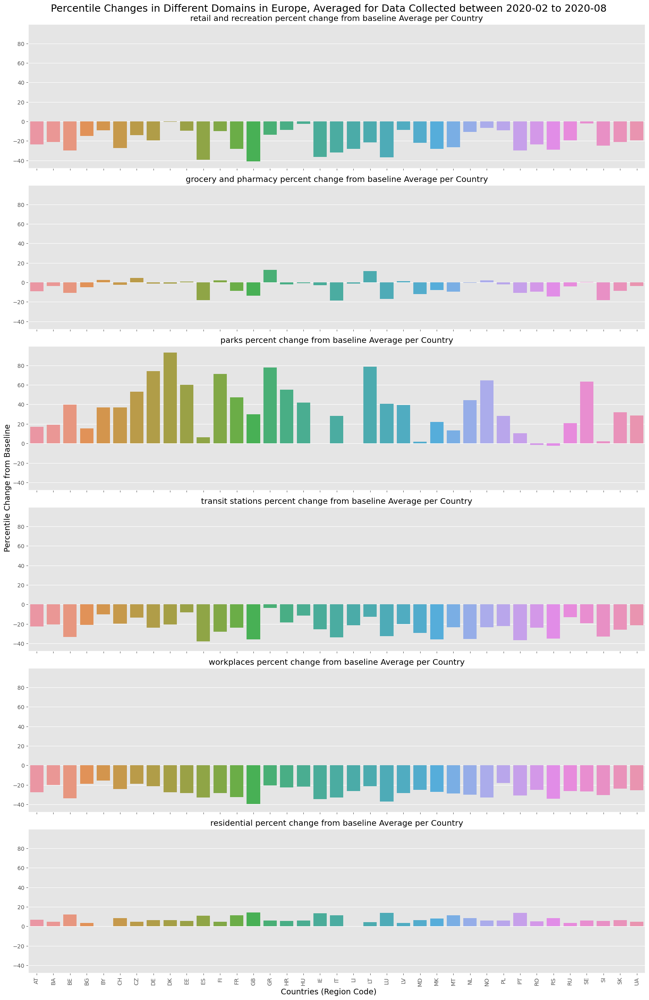

In [126]:
# Figure contains 6 x 1 plots, 6 for each domain, considering only countries within Europe
fig, axs= plt.subplots(6,1,sharey=True,sharex=True,figsize=(16,25))

# Since the most recent dataframe contains an extra column corresponding to the continent of the 
# associated region code (and not a particular domain to be analyzed), we need to retreive the original 
# set of columns corresponding strictly to the domains, which is what we do in the line of code below.
og_columns = global_agg.columns

# Enumertaing of the different dataframes corresponding to the different continents
for j, df  in enumerate(dfsGlobal_agg) :
    if continents[j] == 'Europe' :
        # Enumerating over trhe different columns, and thus the domains
        for i, col in enumerate(og_columns):

            # Proper index formating in order to obtain the correct subplot
            ax=axs[i]

            # Creating a barplot for the specific domain, for a specific continent
            sns.barplot(y=df[col],x=df.index,ax=ax)
            # ax.set_xlabel('Countries (Region Code)')
            ax.set_xlabel('')
            # ax.set_ylabel('Percentage Change from Baseline')
            ax.set_ylabel('')
            ax.set_xticklabels(df.index, rotation=90)
            ax.set_title(str(col).replace('_'," ") + ' Average per Country')

fig.text(0.5, 0.00000005, 'Countries (Region Code)', ha='center', va='center', fontsize=14)
fig.text(0.002, 0.5, 'Percentile Change from Baseline',
         ha='center', va='center', rotation='vertical', fontsize=14)

plt.tight_layout()

# Add more space at the top to avoid overlapping between the title and the rest of the figure.
plt.subplots_adjust(top=0.96)

plt.suptitle('Percentile Changes in Different Domains in Europe, Averaged for Data Collected between 2020-02 to 2020-08', fontsize=18)
plt.show()

## Relation between Physiological Needs and Grocery Stores/ Pharmacy

Grocery Stores: These provide essential food and sustenance necessary for survival. Grocery stores offer a variety of food items, including fresh produce, grains, proteins, and other staples, fulfilling the **basic nutritional requirements to maintain life**.

Pharmacies: Medications and healthcare products available at pharmacies address health-related physiological needs. Access to medicines and healthcare items becomes crucial for **maintaining and restoring physical well-being**.

In [127]:

df_mean = pd.DataFrame()
row_mean_list = []

# List to store 'grocery_and_pharmacy_percent_change_from_baseline' values
grocery_values = []

for j, df in enumerate(dfsGlobal_agg):
    if continents[j] == 'Europe':
        # Extract numerical columns for mean calculation
        numerical_columns = ['retail_and_recreation_percent_change_from_baseline',
                              'parks_percent_change_from_baseline',
                              'transit_stations_percent_change_from_baseline',
                              'workplaces_percent_change_from_baseline',
                              'residential_percent_change_from_baseline',
                            'grocery_and_pharmacy_percent_change_from_baseline']

        # Calculate the mean for each country excluding 'grocery_and_pharmacy_percent_change_from_baseline'
        country_means = df[numerical_columns].mean(axis=1)

        # Append the mean for each country to the list
        row_mean_list.extend(country_means)

        # Append 'grocery_and_pharmacy_percent_change_from_baseline' values to the list
        grocery_values.extend(df['grocery_and_pharmacy_percent_change_from_baseline'])

# Create the 'Country Code' and 'Mean per Country' columns in df_mean
df_mean['Country Code'] = [code for j, df in enumerate(dfsGlobal_agg) if continents[j] == 'Europe' for code in df.index]
df_mean['Mean_per_Country'] = row_mean_list
df_mean['grocery_and_pharmacy_percent_change'] = grocery_values

# Display the resulting DataFrame
print(df_mean)




   Country Code  Mean_per_Country  grocery_and_pharmacy_percent_change
0            AT         -9.797595                            -9.104878
1            BA         -6.973230                            -3.704663
2            BE         -9.263293                           -10.619171
3            BG         -6.751512                            -4.736377
4            BY          0.784974                             2.575130
5            CH         -4.724324                            -2.483619
6            CZ          2.646142                             4.484629
7            DE          2.461586                            -1.172056
8            DK          8.255858                            -1.084879
9            EE          3.387007                             0.968480
10           ES        -18.483007                           -18.110200
11           FI          1.908970                             2.080774
12           FR         -5.735596                            -8.552938
13    

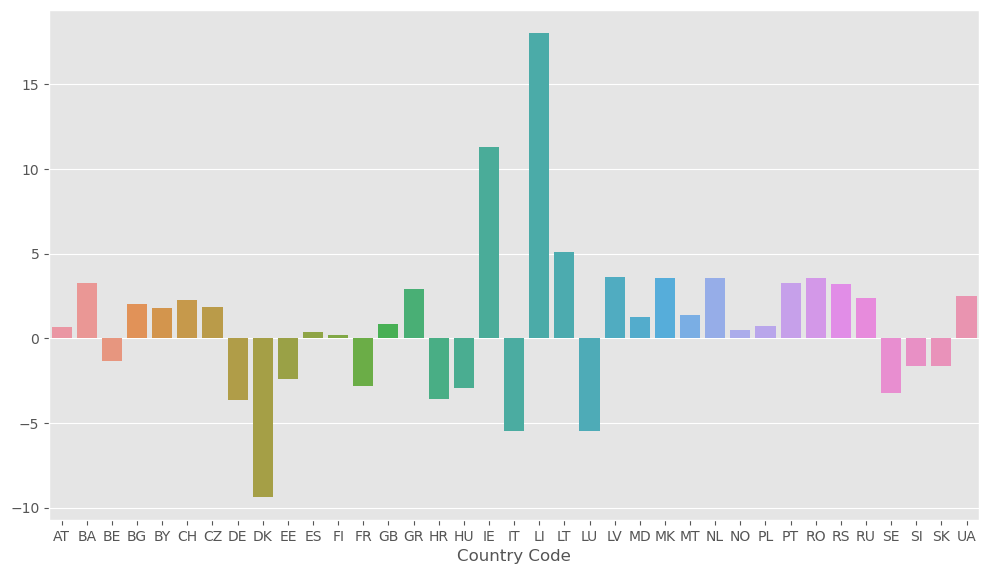

In [128]:
df_difference= df_mean['grocery_and_pharmacy_percent_change'] - df_mean['Mean_per_Country']

# Set the size of the figure
fig, ax = plt.subplots(figsize=(12, 6))  # Adjust the values (width, height) as needed

# Create the bar plot
sns.barplot(y=df_difference, x=df_mean['Country Code'], ax=ax)

# Add more space at the top to avoid overlapping between the title and the rest of the figure.
plt.subplots_adjust(top=0.96)

# Show the plot
plt.show()



**DiD Grocery-Pharmacy vs. Shopping Mall (Google Trends)**



To perform difference in differences we need to define our treatment group, which will consist of the population of different european countries after the covid-19 pandemic kicked in, in our case the start of this "treatment group" will be defined at the date of lockdown, which we chose as the beginning of March for all countries. The control group is a group that is supposed to not have received treatment but that still posesses the same attributes as the treatment group, it needs to be highly similar. Since this is an observational analysis, in this case the best control group would be the same population a year prior (to remove the impact of seasonality) but we do not have enough data to analyse mobility trends in 2019. We will therefore use the data pre-lockdown (early 2020) as our control group. This will be the only case where the difference in differences approach will not account for the interaction between the group variable (g) and the impact of treatment (t). Since our treatment group will already have received the treatment. This is more of a 'Difference' rather than a difference in differences.


"if no treatment had occurred, the difference between the treated group and the untreated group would have stayed the same in the post-treatment period as it was in the pre-treatment period." is the assumption we make.

Here we want to determine whether there have been changes in the interest (as measured by Google search trends) in grocery stores and pharmacies compared to shopping malls before and during the pandemic.


In [129]:
# Adapting the split_group function as per the new requirements
def split_group(df, startct, endct, starttr, endtr, datetrct, datetrtr, column):
    # Convert string dates to datetime
    startct, endct, starttr, endtr, datetrct, datetrtr = pd.to_datetime(
        [startct, endct, starttr, endtr, datetrct, datetrtr])
    
    # Split control and treatment
    df_ct = df[(df['Week'] <= endct) & (df['Week'] >= startct)].copy()
    df_t = df[(df['Week'] <= endtr) & (df['Week'] >= starttr)].copy()
    
    # Add group and "treatment date" columns
    df_ct['g'] = 0
    df_t['g'] = 1
    df_ct['t'] = (df_ct['Week'] >= datetrct).astype(int).copy()
    df_t['t'] = (df_t['Week'] >= datetrtr).astype(int).copy()
    
    # Concatenate control and treatment dataframes
    dff = pd.concat([df_ct, df_t])
    
    # Interaction between group and treatment
    dff['gt'] = dff['g'] * dff['t']
    
    # Select relevant columns
    dff = dff[['Week', column, 'g', 't', 'gt']]
    
    return dff
def did_analysis(data, column):
    
    # Applying the split_group function to our grocery store data
    df_did = split_group(
        data, 
        '2019-01-01', '2020-07-01', # Control period
        '2020-01-01', '2020-07-01', # Treatment period
        '2019-03-01', # Control treatment date
        '2020-03-01', # Treatment treatment date
        column # Column to perform DiD on
    )
    
    df_did[column] = df_did[column].fillna(df_did[column].mean())


    # Now, we will perform the linear regression analysis
    lr = LinearRegression()
    X = df_did[['g', 't', 'gt']]
    y = df_did[column]
    lr.fit(X, y)
    coefficients = lr.coef_

    # Display the coefficient of the interaction term
    value = coefficients[-1]
    
    return value


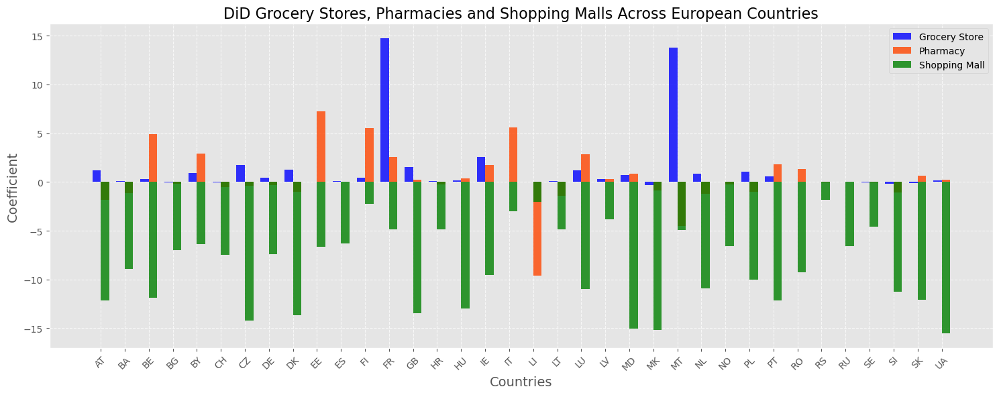

In [130]:
# Lists to store coefficients
grocery_store = []
shopping_mall = []
pharmacy = []

# Process files and perform DiD analysis
European_Countries = ["AT", "BA", "BE", "BG", "BY", "CH", "CZ", "DE", "DK", "EE", "ES", "FI", "FR", "GB", "HR", "HU", "IE", "IT", "LI", "LT", "LU", "LV", "MD", "MK", "MT", "NL", "NO", "PL", "PT", "RO", "RS", "RU", "SE", "SI", "SK", "UA"]

for i in range(1, 37):
    # Construct the file name and read the CSV
    file_name = f'Europe-Physiological-GoogleTrends/multiTimeline ({i}).csv'
    df = pd.read_csv(file_name, skiprows=1)
    df.columns = ['Week', 'Grocery store', 'Shopping mall', 'Pharmacy']
    
    # Convert columns to appropriate types
    df['Grocery store'] = pd.to_numeric(df['Grocery store'], errors='coerce')
    df['Pharmacy'] = pd.to_numeric(df['Pharmacy'], errors='coerce')
    df['Week'] = pd.to_datetime(df['Week'])

    # Store coefficients in respective lists
    grocery_store.append(did_analysis(df,'Grocery store'))
    pharmacy.append(did_analysis(df, 'Pharmacy'))
    shopping_mall.append(did_analysis(df, 'Shopping mall'))
    

# Setting up the parameters for the bar chart
bar_width = 0.35
country_indices = np.arange(len(European_Countries))


# Creating a figure for the bar chart
plt.figure(figsize=(15, 6))

# Plotting grocery store coefficients
plt.bar(country_indices, grocery_store, bar_width, alpha=0.8, color='blue', label='Grocery Store')

# Plotting pharmacy coefficients
plt.bar(country_indices + bar_width, pharmacy, bar_width, alpha=0.8, color='orangered', label='Pharmacy')

plt.bar(country_indices + bar_width, shopping_mall, bar_width, alpha=0.8, color='green', label='Shopping Mall')

# Adding labels and title
plt.xlabel('Countries', fontsize=14)
plt.ylabel('Coefficient', fontsize=14)
plt.title('DiD Grocery Stores, Pharmacies and Shopping Malls Across European Countries', fontsize=16)

# Setting the position of the x-axis ticks
plt.xticks(country_indices + bar_width / 2, European_Countries, rotation=45)

# Adding a legend
plt.legend()

# Adding grid lines for better readability
plt.grid(True, linestyle='--', alpha=0.7)

# Adjusting layout for better fit and readability
plt.tight_layout()

# Displaying the plot
plt.show()

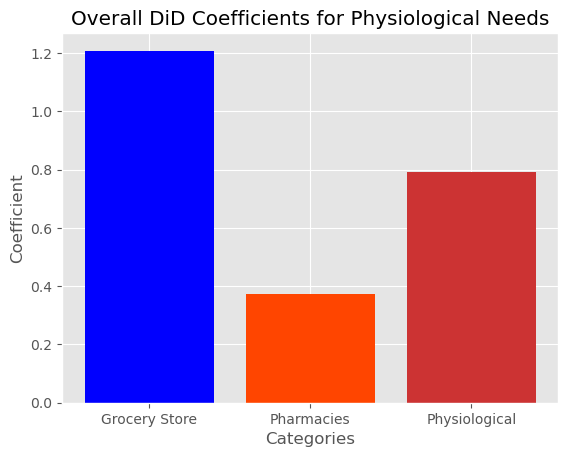

In [131]:
overall=[np.mean(grocery_store),np.mean(pharmacy),np.mean(grocery_store+pharmacy)]
labels=['Grocery Store','Pharmacies','Physiological']

plt.bar(labels,overall,color=['blue','orangered',(0.8, 0.2, 0.2)])
plt.ylabel('Coefficient')
plt.xlabel('Categories')
plt.title('Overall DiD Coefficients for Physiological Needs')
plt.savefig('physio_final.png',bbox_inches='tight')

## Apple Mobility Trends

This dataset contains the use percentage (with the first day where data was recorded being set at 100%, to be used as a baseline) during a given day, of a particular transportation type (either Driving, Walking or Transit) for different countries. Data has been recorded daily, between 2020-01-13 and 2020-04-20. We can use this dataset to see how covid has impacted how people use different mobility types, and thus evaluate how this can some how represent a shift in importance in Maslow's pyramid.

In [146]:
apple_mr=pd.read_csv('DATA/applemobilitytrends-2020-04-20.csv')
apple_mr

,geo_type,region,transportation_type,2020-01-13,2020-01-14,2020-01-15,2020-01-16,2020-01-17,2020-01-18,2020-01-19,...,2020-04-11,2020-04-12,2020-04-13,2020-04-14,2020-04-15,2020-04-16,2020-04-17,2020-04-18,2020-04-19,2020-04-20
0,country/region,Albania,driving,100,95.30,101.43,97.20,103.55,112.67,104.83,...,25.47,24.89,32.64,31.43,30.67,30.00,29.26,22.94,24.55,31.51
1,country/region,Albania,walking,100,100.68,98.93,98.46,100.85,100.13,82.13,...,27.63,29.59,35.52,38.08,35.48,39.15,34.58,27.76,27.93,36.72
2,country/region,Argentina,driving,100,97.07,102.45,111.21,118.45,124.01,95.44,...,19.40,12.89,21.10,22.29,23.55,24.40,27.17,23.19,14.54,26.67
3,country/region,Argentina,walking,100,95.11,101.37,112.67,116.72,114.14,84.54,...,15.75,10.45,16.35,16.66,17.42,18.18,18.80,17.03,10.59,18.44
4,country/region,Australia,driving,100,102.98,104.21,108.63,109.08,89.00,99.35,...,26.95,31.72,53.14,55.91,56.56,58.77,47.51,36.90,53.34,56.93
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
390,city,Washington DC,transit,100,100.78,103.92,105.02,112.26,96.01,87.76,...,16.99,14.23,17.01,17.37,17.02,17.10,17.14,16.61,16.66,18.20
391,city,Washington DC,walking,100,99.07,109.61,104.16,123.16,119.71,106.28,...,44.63,32.84,33.58,37.56,38.69,37.76,42.50,41.80,43.51,41.89
392,city,Zurich,driving,100,102.38,110.84,105.48,113.83,109.67,102.03,...,63.78,54.97,67.09,72.52,74.89,77.13,78.01,73.62,71.97,73.74
393,city,Zurich,transit,100,101.51,108.93,97.87,103.91,98.50,93.83,...,29.18,31.49,32.90,35.71,35.68,33.65,36.77,36.75,37.66,37.50


Create a new dataframe where we subtract 100 from all values, in order to show the relative change from the baseline

In [147]:
# Creating an array containing the columns from which we will not subtract anything, since they do not contain any values
columnsExcluded = ['geo_type', 'region', 'transportation_type']

# Creating a ccopy of the dataframe in order to avoid any unwanted changes moving forward.
apple_mr_copy = apple_mr.copy()

# Subtracting 100 from all applicable columns using the '.iloc' and 'isin' methods
apple_mr_copy.iloc[:, ~apple_mr_copy.columns.isin(columnsExcluded)] = \
                       apple_mr_copy.loc[:, ~apple_mr_copy.columns.isin(columnsExcluded)] -100
apple_mr_copy

,geo_type,region,transportation_type,2020-01-13,2020-01-14,2020-01-15,2020-01-16,2020-01-17,2020-01-18,2020-01-19,...,2020-04-11,2020-04-12,2020-04-13,2020-04-14,2020-04-15,2020-04-16,2020-04-17,2020-04-18,2020-04-19,2020-04-20
0,country/region,Albania,driving,0,-4.70,1.43,-2.80,3.55,12.67,4.83,...,-74.53,-75.11,-67.36,-68.57,-69.33,-70.00,-70.74,-77.06,-75.45,-68.49
1,country/region,Albania,walking,0,0.68,-1.07,-1.54,0.85,0.13,-17.87,...,-72.37,-70.41,-64.48,-61.92,-64.52,-60.85,-65.42,-72.24,-72.07,-63.28
2,country/region,Argentina,driving,0,-2.93,2.45,11.21,18.45,24.01,-4.56,...,-80.60,-87.11,-78.90,-77.71,-76.45,-75.60,-72.83,-76.81,-85.46,-73.33
3,country/region,Argentina,walking,0,-4.89,1.37,12.67,16.72,14.14,-15.46,...,-84.25,-89.55,-83.65,-83.34,-82.58,-81.82,-81.20,-82.97,-89.41,-81.56
4,country/region,Australia,driving,0,2.98,4.21,8.63,9.08,-11.00,-0.65,...,-73.05,-68.28,-46.86,-44.09,-43.44,-41.23,-52.49,-63.10,-46.66,-43.07
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
390,city,Washington DC,transit,0,0.78,3.92,5.02,12.26,-3.99,-12.24,...,-83.01,-85.77,-82.99,-82.63,-82.98,-82.90,-82.86,-83.39,-83.34,-81.80
391,city,Washington DC,walking,0,-0.93,9.61,4.16,23.16,19.71,6.28,...,-55.37,-67.16,-66.42,-62.44,-61.31,-62.24,-57.50,-58.20,-56.49,-58.11
392,city,Zurich,driving,0,2.38,10.84,5.48,13.83,9.67,2.03,...,-36.22,-45.03,-32.91,-27.48,-25.11,-22.87,-21.99,-26.38,-28.03,-26.26
393,city,Zurich,transit,0,1.51,8.93,-2.13,3.91,-1.50,-6.17,...,-70.82,-68.51,-67.10,-64.29,-64.32,-66.35,-63.23,-63.25,-62.34,-62.50


Split the original dataframe into different dataframes based on the transportation type, and store them in the array "dfsApple".

In [148]:
# Creating an array conatining the 3 different transportation types using the '.unique()' method.
transportationType = apple_mr_copy['transportation_type'].unique()

# Array where we will store the different datafrmes based on transportation type.
dfsApple = []

#Creating the different dataframes
for transport in transportationType :
    dfsApple.append(apple_mr_copy[apple_mr_copy['transportation_type'] == transport].copy())

Calculate the average of each column in order to have a worldwide analysis.

In [149]:
# Remove the first three columns for the dataframes since they don't contain any values
dfsAppleVals = []
for df in dfsApple :
    dfCopy = df.copy()
    dfCopy = dfCopy.loc[:, ~dfCopy.columns.isin(columnsExcluded)]
    dfsAppleVals.append(dfCopy)

# Calculate Averages of Columns of each dataframe
dfsAvgs = []
for df in dfsAppleVals :
    dfsAvgs.append(df.mean().copy())

### Case Study : Worldwide By Averaging

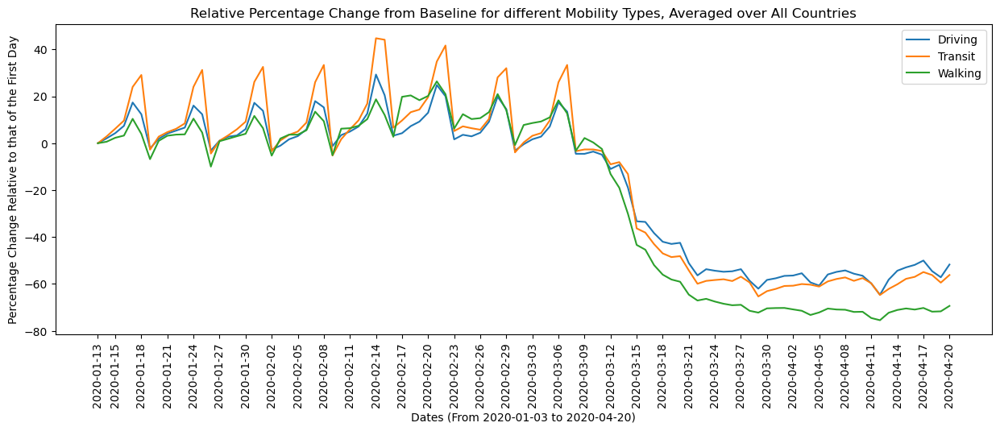

In [ ]:
# Collectig all of the dates from the dataframe (corresponds to all of the columns except the first 3)
dates = apple_mr_copy.columns
dates = dates[3:]

# Reduce the dates array in order to make the plots more readable (we only take the dates that are in 
# positions that correspond to multiples of 3)
dates_mod = dates[(np.arange(len(dates)) + 1) % 3 == 0]

# Putting the first date back into to the reduced dates array
dates_mod = dates_mod.insert(0, dates[0])

plt.figure(figsize=(15,5))

# Creating a lineplot containing the evolution for different transportation types
sns.lineplot(x=dates, y=dfsAvgs[0], label= 'Driving')
sns.lineplot(x=dates, y=dfsAvgs[1], label= 'Transit')
sns.lineplot(x=dates, y=dfsAvgs[2], label= 'Walking')
plt.xticks(rotation=90)
plt.xticks(dates_mod)
plt.xlabel('Dates (From 2020-01-03 to 2020-04-20)')
plt.ylabel('Percentage Change Relative to that of the First Day')

plt.legend()

plt.title('Relative Percentage Change from Baseline for different Mobility Types, Averaged over All Countries')
plt.show()

### Case Study : Italy 
This is particularly intersting since we can combine this analysis with the one we did for the 'interventions' dataset, and observe the correlation between the date of these interventions and the evolution of the usage of these different mobility types.

In [ ]:
# Adapting the timestamp variables from the interventions datasets in order to implement 
# them in the following graphs (and converting them in order for them to be compatible 
# when creating the plots) 
itLockdown = interventions['Lockdown'][3].strftime('%Y-%m-%d %H:%M:%S')
itLockdown = itLockdown.replace(" 00:00:00", "")
itNormalcy = interventions['Normalcy'][3].strftime('%Y-%m-%d %H:%M:%S')
itNormalcy = itNormalcy.replace(" 00:00:00", "")
it1stCase = interventions['1st case'][3].strftime('%Y-%m-%d %H:%M:%S')
it1stCase = it1stCase.replace(" 00:00:00", "")

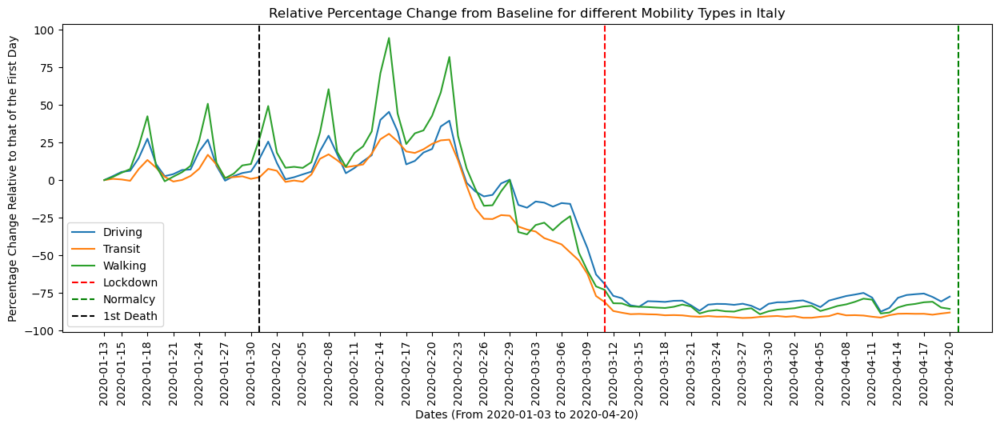

In [ ]:
# Collecting data that's only relevant to italy
apple_italy = apple_mr_copy[apple_mr_copy['region'] == 'Italy'].copy()
apple_italy = apple_italy.iloc[:, ~apple_italy.columns.isin(columnsExcluded)]

 
plt.figure(figsize=(15,5))

# Creating a lineplot containing the evolution for different transportation types
sns.lineplot(x=dates, y=apple_italy.values[0], label= 'Driving')
sns.lineplot(x=dates, y=apple_italy.values[1], label= 'Transit')
sns.lineplot(x=dates, y=apple_italy.values[2], label= 'Walking')

plt.xticks(rotation=90)
plt.xticks(dates_mod)

# Creating 3 vertical lines, indicating the when the interventions (Lockdown, Normalcy and 1st Case)
plt.axvline(x=itLockdown,color='red', linestyle='--', label='Lockdown')
plt.axvline(x=itNormalcy,color='green', linestyle='--', label='Normalcy')
plt.axvline(x=it1stCase,color='black', linestyle='--', label='1st Death')

plt.xlabel('Dates (From 2020-01-03 to 2020-04-20)')
plt.ylabel('Percentage Change Relative to that of the First Day')
plt.legend()

plt.title('Relative Percentage Change from Baseline for different Mobility Types in Italy')
plt.show()

We can see in the figure above that the decrease in the transport use percentage, for all three mobility types, starts to decrease after thre is a first Covid case, and by the time lockdown is fully in place, the transport usage has drastically decreased. This shows the impact of Covid-19 related interventions on the mobility types.

### Case Study : Different European Countries

Creating an array that contains different european country that we would like to study

In [ ]:
euroCountries = ['France',
                 'Denmark',
                 'Germany',
                 'Italy',
                 'Netherlands',
                 'Norway',
                 'Sweden',
                 'Finland',
                 'Switzerland',
                 'UK',
                 'Spain',
                 'Belgium']


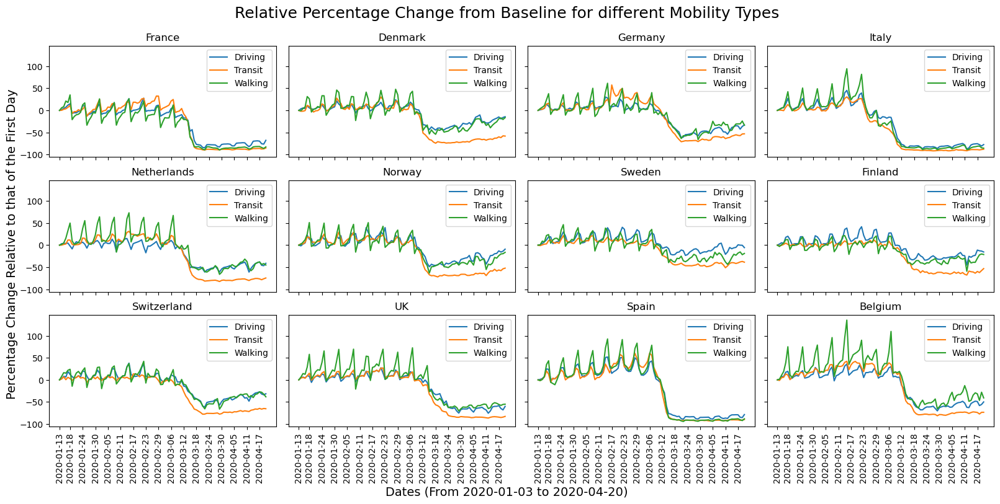

In [ ]:
# Reduce the dates array in order to make the plots more readable (we only take the dates that are in 
# positions that correspond to multiples of 6)
dates_mod2 = dates[(np.arange(len(dates)) + 1) % 6 == 0]

# Putting the first date back into the modified dates array
dates_mod2 = dates_mod2.insert(0, dates[0])

# Figure contains 3x4 (12) subplots, one for each european country that we will be analyzing 
fig, axs= plt.subplots(3, 4, sharey=True, sharex=True, figsize=(16,8))

# Iterate over every country in the 'euroCountries' array
for i, country in enumerate(euroCountries) :

    # Create a dataframe containing only the data for the specific country and removes the 
    # first three columns that don't contain values
    dfAppleCurrent = apple_mr_copy[apple_mr_copy['region'] == country].copy()
    dfAppleCurrent = dfAppleCurrent.iloc[:, ~dfAppleCurrent.columns.isin(columnsExcluded)]

    # Proper index formating to be at the right plot
    ax = axs[i//4, i%4]

    # Create three lineplots, one for each mobility type
    sns.lineplot(x=dates, y=dfAppleCurrent.values[0], label= 'Driving', ax=ax)
    sns.lineplot(x=dates, y=dfAppleCurrent.values[1], label= 'Transit', ax=ax)
    sns.lineplot(x=dates, y=dfAppleCurrent.values[2], label= 'Walking', ax=ax)

    # Setting the dates for the x-axis to the ones corresponding to the 'dates_mod2' array,
    # in order to have more readable plots, and turn them vertically
    ax.set_xticks(dates_mod2)
    ax.set_xticklabels(labels= dates_mod2,rotation=90)    
    ax.set_title(country)

# Adding general titles to the x and y-axis
fig.text(0.5, 0.00000005, 'Dates (From 2020-01-03 to 2020-04-20)', ha='center',
         va='center', fontsize=14)
fig.text(0.002, 0.5, 'Percentage Change Relative to that of the First Day', ha='center',
         va='center', rotation='vertical', fontsize=14)

# Addjusting figure formatting
plt.tight_layout()
plt.subplots_adjust(top=0.9)

# Adding a general title
plt.suptitle('Relative Percentage Change from Baseline for different Mobility Types', fontsize=18)
plt.show()

From this data we can observe that there is indeed a decline in mobility patterns after lockdown. However linking this decrease to a physiological need is not trivial. Physiological needs incorporate all types of most basic needs such as grocery shopping, which is usually done using a car or public transport. The latter cannot be accuratly used to relate to grocery shopping being the reason of the remaining presence of these means of transportation since its use was greatly diminished due also to the higher risk of contamination with the contact of other strangers in a closed space. We however can observe in all these graphs that driving mobility trends are nearly always the ones following the smallest decline. This could be due to the effect of the basic need of grocery shopping, that had to still be fulfilled even during the pandemic. These mobility trends are however not sufficient to make any meaningful conclusions, we also have no clear indication that the pandemic was the only cause of a decrease in these mobility patterns, we need to be assured of these by performing a difference in differences analysis (see below).

### Difference in Differences analysis

In [150]:
#Keeping the relevant columns
euroCountries = ['France', 'Albania', 'Belgium', 'Bulgaria', 'Croatia', 'Czech Republic', 'Denmark', 'Estonia','Finland',
                 'Germany', 'Greece', 'Hungary', 'Ireland', 'Latvia', 'Lithuania', 'Luxembourg', 'Italy','Poland', 'Portugal',
                 'Romania', 'Serbia', 'Slovakia', 'Slovenia', 'Netherlands', 'Ukraine', 'Norway', 'Sweden', 'Finland', 
                 'Switzerland', 'UK', 'Spain']
apple_mr_euro = apple_mr_copy[apple_mr_copy['region'].isin(euroCountries)]


**Let's take the case of Italy**

In [151]:
#Keeping the lines corresponding to Italy
apple_it = apple_mr_euro[apple_mr_euro['region'] == 'Italy']
apple_it
apple_it = apple_it.melt(id_vars=["geo_type", "region", "transportation_type"], 
        var_name="Date", 
        value_name="Value")
apple_it

,geo_type,region,transportation_type,Date,Value
0,country/region,Italy,driving,2020-01-13,0.00
1,country/region,Italy,transit,2020-01-13,0.00
2,country/region,Italy,walking,2020-01-13,0.00
3,country/region,Italy,driving,2020-01-14,2.63
4,country/region,Italy,transit,2020-01-14,0.82
...,...,...,...,...,...
292,country/region,Italy,transit,2020-04-19,-88.62
293,country/region,Italy,walking,2020-04-19,-84.63
294,country/region,Italy,driving,2020-04-20,-77.38
295,country/region,Italy,transit,2020-04-20,-87.95


Create functions to label control and treatment based on date. Here we cannot add a dependency on time, our control group cannot "experience" the transition relating to the impact of covid since it is occuring before this event and we do not have enough data to make two parallel comparable timelines. Therefore the only information we will provide the regressor is wether it is before or after treatment, which is similar to simply make a comparison before & after lockdown, this is not a proper DiD analysis.

In [152]:
#labeling the dataframe with corresponding starting and ending dates of both control and treatment groups
#0 for control, 1 for treatment
apple_it['g'] = (apple_it['Date'] >= '2020-03-01').astype(int)
apple_it_d = apple_it[apple_it['transportation_type']=='driving']
apple_it_t = apple_it[apple_it['transportation_type']=='transit']
apple_it_w = apple_it[apple_it['transportation_type']=='walking']

Italy as a whole [-88.32660539]
Italy driving [-81.26137255]
Italy transit [-87.19528186]
Italy walking [-96.52316176]


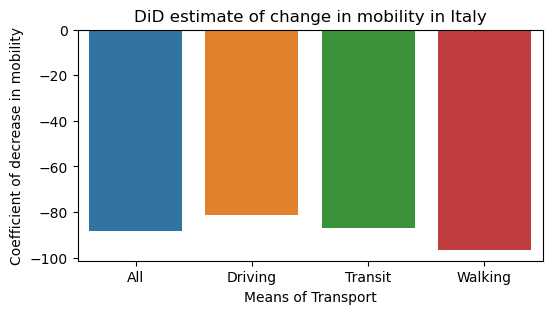

In [157]:
#computing regressions
Values = []
def reg(df):
    lr = LinearRegression()
    X = df[['g']]
    y = df['Value']
    lr.fit(X, y)
    Values.append(lr.coef_[0])
    return lr.coef_

print('Italy as a whole ' + str(reg(apple_it)))
print('Italy driving ' + str(reg(apple_it_d)))
print('Italy transit ' + str(reg(apple_it_t)))
print('Italy walking ' + str(reg(apple_it_w)))


# Create a new DataFrame for plotting
df_plot = pd.DataFrame({
    'Categories': ['All', 'Driving', 'Transit', 'Walking'],
    'Values': Values
})
# Create the plot
plt.figure(figsize=(6,3))
sns.barplot(x='Categories', y='Values', data=df_plot)
plt.ylabel('Coefficient of decrease in mobility')
plt.xlabel('Means of Transport')
plt.title('DiD estimate of change in mobility in Italy')
plt.show()


**For the whole of EU**

In [154]:
#flip the dataset using melt with respect to transportation type and date and region
appleeu = apple_mr_euro.melt(id_vars=["geo_type", "region", "transportation_type"], 
        var_name="Date", 
        value_name="Value")
#groupby transportation type and date and take the mean
appleeu = appleeu.groupby(['Date','transportation_type'])['Value'].mean().reset_index()
appleeu


,Date,transportation_type,Value
0,2020-01-13,driving,0.000000
1,2020-01-13,transit,0.000000
2,2020-01-13,walking,0.000000
3,2020-01-14,driving,1.373667
4,2020-01-14,transit,-0.518824
...,...,...,...
292,2020-04-19,transit,-70.084118
293,2020-04-19,walking,-56.157000
294,2020-04-20,driving,-47.669000
295,2020-04-20,transit,-68.464118


EU as a whole [-58.65516623]
EU driving [-50.24680392]
EU transit [-64.60960856]
EU walking [-61.10908619]


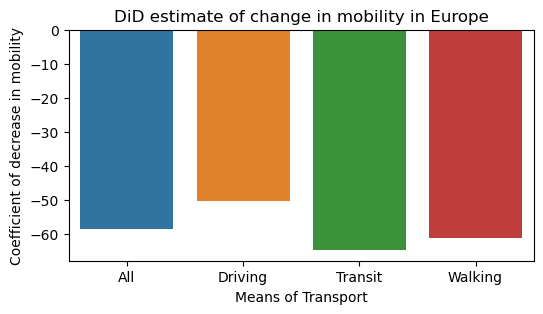

In [156]:
#perform DiD analysis

appleeu['g'] = (appleeu['Date'] >= '2020-03-01').astype(int)
appleeu_d = appleeu[appleeu['transportation_type']=='driving']
appleeu_t = appleeu[appleeu['transportation_type']=='transit']
appleeu_w = appleeu[appleeu['transportation_type']=='walking']

Values = []
print('EU as a whole ' + str(reg(appleeu)))
print('EU driving ' + str(reg(appleeu_d)))
print('EU transit ' + str(reg(appleeu_t)))
print('EU walking ' + str(reg(appleeu_w)))


# Create a new DataFrame for plotting
df_plot = pd.DataFrame({
    'Categories': ['All', 'Driving', 'Transit', 'Walking'],
    'Values': Values
})
# Create the plot
plt.figure(figsize=(6,3))
sns.barplot(x='Categories', y='Values', data=df_plot)
plt.ylabel('Coefficient of decrease in mobility')
plt.xlabel('Means of Transport')
plt.title('DiD estimate of change in mobility in Europe')
plt.show()

We observe a higher decrease for walking and transit, which rightfully confirms theories that we made beforehand on graph analysis. The surface analysis made still holds.

# EU Employment Trends

In [108]:
#import data
dfeu = pd.read_csv('DATA/eu.tsv',sep='\t')
countries = pd.read_csv('DATA/countries_list.csv.xls')


In [109]:
dfts=process_eu_unemployment(dfeu,countries,0)
dfts=dfts[~(dfts['Country'].isin(['United States','Japan','Turkey']))]
dfts

,Country,age,unit,sex,Country_code,Date,Value,Year,Month
0,Austria,TOTAL,PC_ACT,F,AT,2020-07-01,4.5,2020,7
1,Austria,TOTAL,PC_ACT,M,AT,2020-07-01,5.8,2020,7
2,Austria,TOTAL,PC_ACT,T,AT,2020-07-01,5.2,2020,7
3,Austria,TOTAL,THS_PER,F,AT,2020-07-01,96.0,2020,7
4,Austria,TOTAL,THS_PER,M,AT,2020-07-01,142.0,2020,7
...,...,...,...,...,...,...,...,...,...
5272,United Kingdom,Y_LT25,PC_ACT,M,UK,2019-11-01,12.3,2019,11
5273,United Kingdom,Y_LT25,PC_ACT,T,UK,2019-11-01,10.9,2019,11
5274,United Kingdom,Y_LT25,THS_PER,F,UK,2019-11-01,183.0,2019,11
5275,United Kingdom,Y_LT25,THS_PER,M,UK,2019-11-01,268.0,2019,11


# General look over all EU Data

The general approach for treating this side of the study would be to target different types of groups accros the EU and study their respective employment behaviors. 
The following function devides our given dataset into two metrics: the percentage of unemployment and the total number of incative people.
Then it averages the data into monthly values, aggregates it by group and plots the respective timeseries.

The groups we decided to look at were the age ranges, the sexes and the countries. Giving us an overall feeling about the safety-related trends amongst all european citizens before and after lockdown.

To delve deeper into our study, an indicator variable was created to determine whether a value is before or after lockdown, considering the mean lockdwon month to be march of 2020.

The first, naive approach taken was performing a linear regression over the percentage data and studying the impact of the `Lockdown:Group` interaction to determine the fluctuations in employment amongst groups.

In [138]:
def unemployment_across_groups(dfts,test_group,size=(12,18),save='default.png'):
    #devide dataset between different metrics
    df_percentage=dfts[dfts['unit']=='PC_ACT'].drop(columns='unit').copy()
    df_numeric=dfts[~(dfts['unit']=='PC_ACT')].drop(columns='unit').copy()
    #compile data needed for graph generation
    generals=[df_percentage,df_numeric]
    ylabels=['Unemployment Percentage','Unemployed People (x1000)']
    #Iterate over each metric dataset
    results=[]

    plt.style.use('seaborn-whitegrid')
    fig ,ax=plt.subplots(figsize=size)
    for i in range(len(generals)):
        #Select metric
        df=generals[i]
        #Aggregate by testing group and Date to get monthly mean 
        df_agg=df.groupby([test_group,'Date']).mean(numeric_only=True)['Value'].copy()
        #'Flatten' the indeces to get only one index column corresponding to the testing group
        df_agg=df_agg.reset_index(level='Date')
        #Plot the different lines for each of the testing group elements
        if(i==0):
            ax.axvline(x=datetime(2020,3,1),color='red', linestyle='--', label='Lockdown')
            for idx in df_agg.index.unique(): 
                sns.lineplot(x=df_agg.loc[idx]['Date'],y=df_agg.loc[idx]['Value'],label=idx,ax=ax)
        #Add details to the plot
                ax.legend(loc='upper left')
                ax.set_xlabel('Date')
                ax.set_ylabel(ylabels[i])
                ax.set_title(f'{ylabels[i]} per {test_group} across Europe')
        df_agg=process_group_df(df_agg,test_group)
        results.append(df_agg)
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.savefig(save)
    plt.show()
    return results

### Distribution amongst age groups

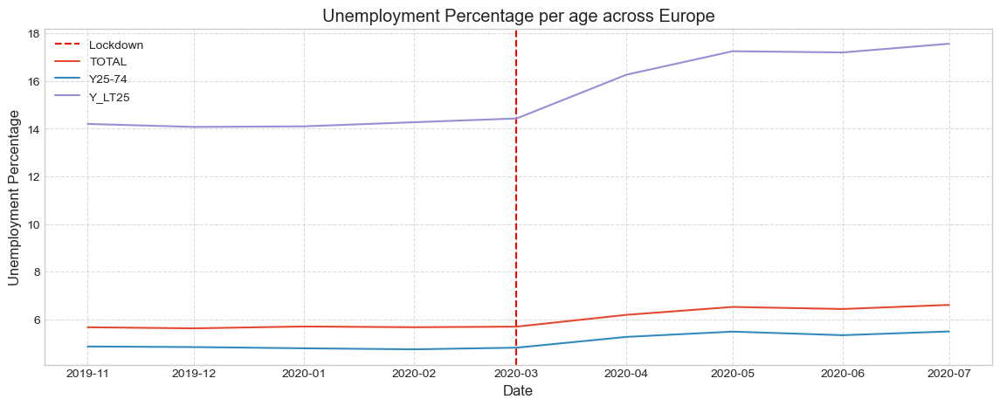

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  Value   R-squared:                       0.642
Model:                            OLS   Adj. R-squared:                  0.596
Method:                 Least Squares   F-statistic:                     13.76
Date:                Fri, 22 Dec 2023   Prob (F-statistic):           2.38e-05
Time:                        14:43:17   Log-Likelihood:                -66.707
No. Observations:                  27   AIC:                             141.4
Df Residuals:                      23   BIC:                             146.6
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
========================================================================================
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
Intercept                8.2134      0.895      9.174      0.000       6.361      10.066
age[TOTAL]:lockdown     -1.9216      1.651     -1.164      0.256      -5.337       1.493
age[Y25-74]:lockdown    -2.9327      1.651     -1.776      0.089      -6.348       0.482
age[Y_LT25]:lockdown     8.3298      1.651      5.046      0.000       4.915      11.745
==============================================================================
Omnibus:                        5.424   Durbin-Watson:                   0.595
Prob(Omnibus):                  0.066   Jarque-Bera (JB):                4.219
Skew:                           0.965   Prob(JB):                        0.121
Kurtosis:                       3.168   Cond. No.                         3.87
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [139]:
#Generate initial dataframes and graphs
res_age=unemployment_across_groups(dfts,'age',(14,5))
#Create Regression
regression_age=regression_helper(res_age[0],'age')
#Print out the regerssion results
regression_age.summary()

C:\Users\Kamal\OneDrive\Documents\GitHub\ada-2023-project-bobeast\helpers.py:181: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  df_pie=df_pie.groupby(group).sum().drop(total)
C:\Users\Kamal\OneDrive\Documents\GitHub\ada-2023-project-bobeast\helpers.py:181: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  df_pie=df_pie.groupby(group).sum().drop(total)


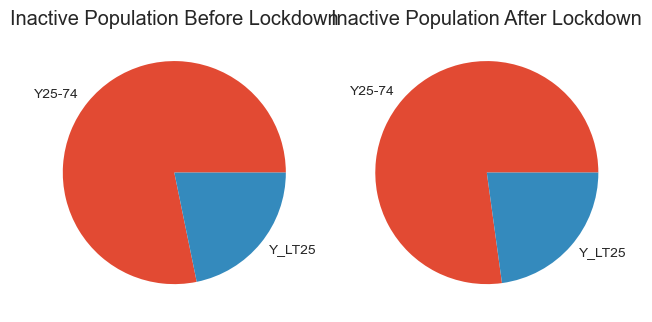

In [140]:
#Using the helper function below to plot our results
plot_pies(res_age[1],'age','TOTAL')

#### Interpretation
These plots show that the fraction of young, inactive people has grown after lockdown. 

### Distribution amongst sexes

Similarly to the study amongst age groups, we plot the timeseries of the unployment rates and the pie charts

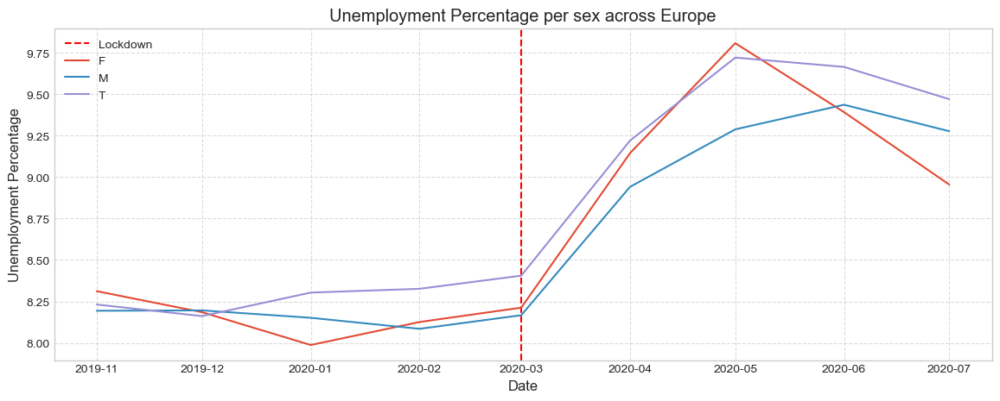

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  Value   R-squared:                       0.628
Model:                            OLS   Adj. R-squared:                  0.580
Method:                 Least Squares   F-statistic:                     12.95
Date:                Fri, 22 Dec 2023   Prob (F-statistic):           3.67e-05
Time:                        14:43:21   Log-Likelihood:                -11.484
No. Observations:                  27   AIC:                             30.97
Df Residuals:                      23   BIC:                             36.15
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
===================================================================================
                      coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------
Intercept           8.1880      0.116     70.708      0.000       7.948       8.428
sex[F]:lockdown     0.9149      0.214      4.285      0.000       0.473       1.357
sex[M]:lockdown     0.8344      0.214      3.908      0.001       0.393       1.276
sex[T]:lockdown     1.1091      0.214      5.194      0.000       0.667       1.551
==============================================================================
Omnibus:                        8.543   Durbin-Watson:                   1.591
Prob(Omnibus):                  0.014   Jarque-Bera (JB):                6.634
Skew:                          -1.046   Prob(JB):                       0.0363
Kurtosis:                       4.232   Cond. No.                         3.87
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [141]:
res_sex=unemployment_across_groups(dfts,'sex',(14,5))
regression_sex=regression_helper(res_sex[0],'sex')
regression_sex.summary()

C:\Users\Kamal\OneDrive\Documents\GitHub\ada-2023-project-bobeast\helpers.py:181: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  df_pie=df_pie.groupby(group).sum().drop(total)
C:\Users\Kamal\OneDrive\Documents\GitHub\ada-2023-project-bobeast\helpers.py:181: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  df_pie=df_pie.groupby(group).sum().drop(total)


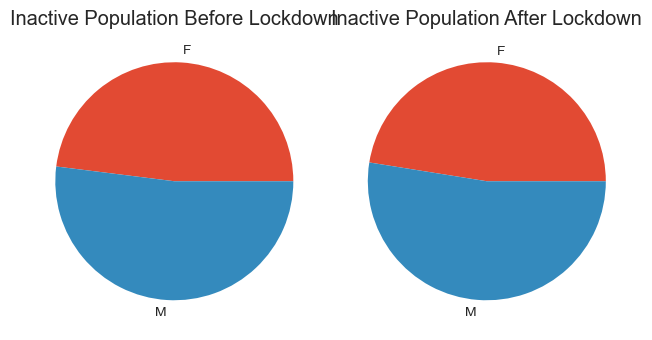

In [142]:
plot_pies(res_sex[1],'sex','T')

## Distribution amongst Countries

For this analysis, we plot the usual graphs and exctract the coefficients of linear regression. This allows us to *naively* look at the per country evolution of unemployment among the different EU countries.

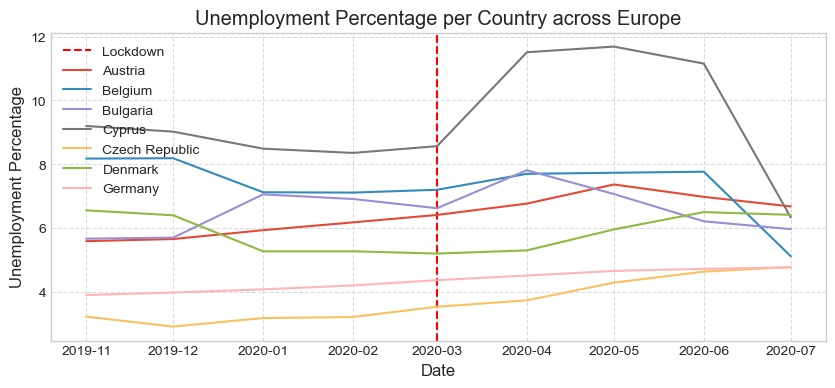

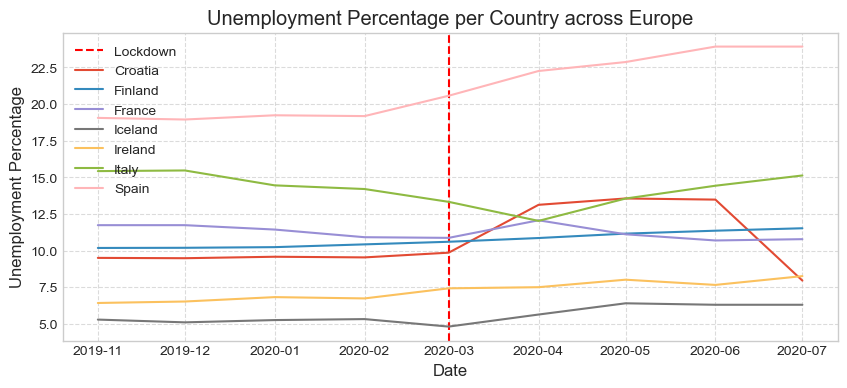

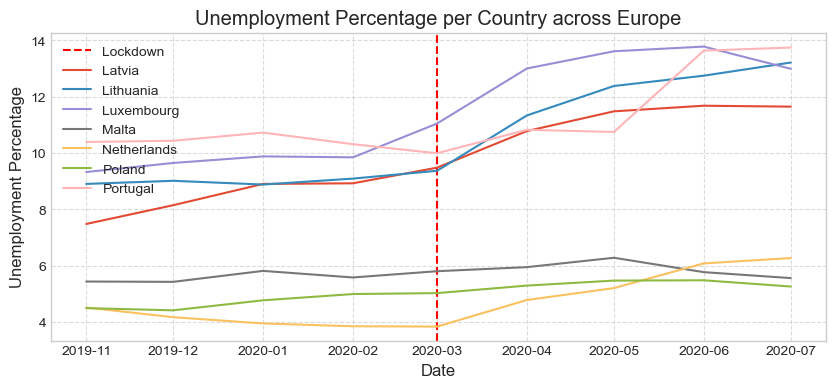

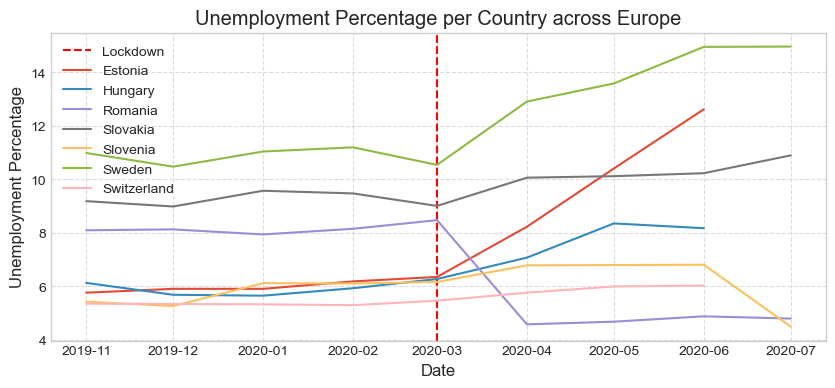

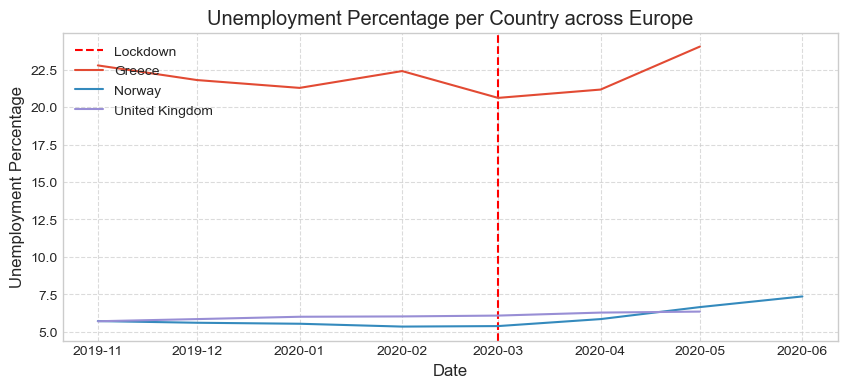

In [143]:
splits=np.split((dfts['Country'].unique())[:-3],4)
splits.append(dfts['Country'].unique()[-3:])
dfs_country=[dfts[dfts['Country'].isin(s)] for s in splits]
res_country=[]
saves=['c1.png','c2.png','c3.png','c4.png','c5.png']
for i in range(len(dfs_country)):
    r_group=unemployment_across_groups(dfs_country[i],'Country',size=(10,4),save=saves[i])
    res_country.append(r_group)

In [10]:
#Exctract the different regresion coefficients 
coefs=[]
for r in res_country:
    res=regression_helper(r[0],'Country')
    coefs.append(res.params)

#Create a dataframe with all the countries' coeffectients 
df_coefs=pd.DataFrame()
for c in coefs:
    #concatenate all coefficient dataframes
    df_coefs=pd.concat([df_coefs,c])
    #drop the intercept metric
    df_coefs=df_coefs.drop('Intercept',axis=0)
#rename column
df_coefs.columns=['coefs']

#Change index type from categorical to string
df_coefs.index=df_coefs.index.astype(str)
new_index=[]
#Create new indices that contain only the countries' names.
for i in df_coefs.index:
    i=str(i).split('Country[')[1]
    i=i.split(']:lockdown')
    new_index.append(i[0])
#set new index
df_coefs.index=new_index
#sort by value in ascending order
df_coefs=df_coefs.sort_values('coefs')
df_coefs

,coefs
Iceland,-5.123214
United Kingdom,-4.930556
Norway,-4.858333
Ireland,-3.243214
Netherlands,-2.170079
Poland,-2.098968
Romania,-1.826349
Czech Republic,-1.754229
Malta,-1.532302
Switzerland,-1.495238


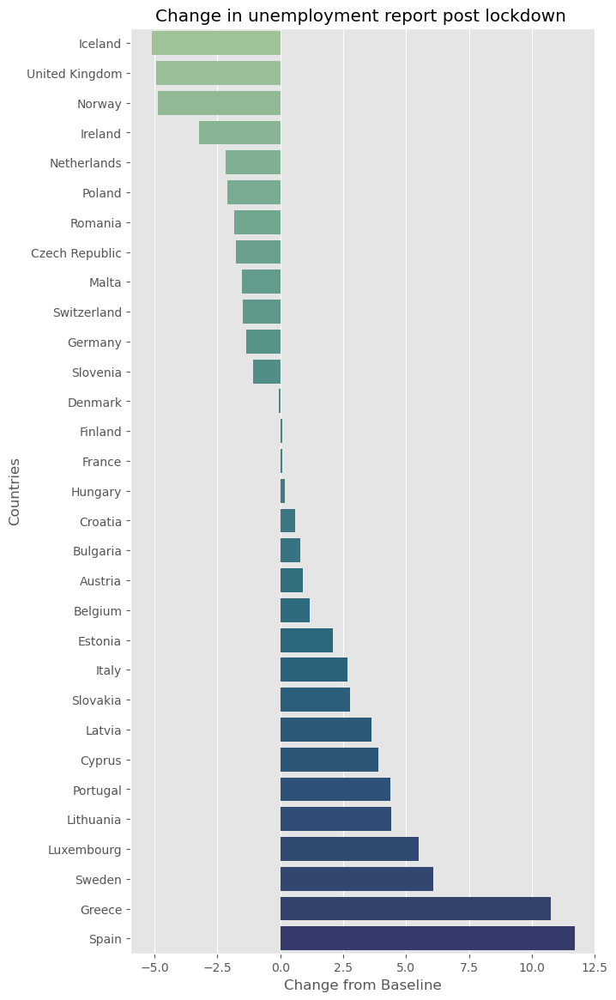

In [11]:
#Generate bar plot of the different coefficients
plt.figure(figsize=(7,14))
sns.barplot(y=df_coefs.index,x=df_coefs.values.flatten(),palette='crest')
plt.ylabel('Countries')
plt.xlabel('Change from Baseline')
plt.title('Change in unemployment report post lockdown ')
plt.savefig("ls_t.png", bbox_inches='tight')
plt.show()

#### Interpretation

This analysis shows that some countries, like iceland, had a thriving employment situation during lockdown whilst other countries, such as spaii, were struggling with employment levels.
This analysis has one main fallacy: it does not take seasonality into account. A falacy that ***Difference in Differences** solves.

# **Difference in Differences**

### Base case : Italy

In [12]:
# Process dataframe to the desired outcome
dftd=process_eu_unemployment(dfeu,countries,1)
dftd

,Country,age,unit,sex,Country_code,Date,Value,Year,Month
0,Austria,TOTAL,PC_ACT,F,AT,2020-07-01,4.5,2020,7
1,Austria,TOTAL,PC_ACT,M,AT,2020-07-01,5.8,2020,7
2,Austria,TOTAL,PC_ACT,T,AT,2020-07-01,5.2,2020,7
3,Austria,TOTAL,THS_PER,F,AT,2020-07-01,96.0,2020,7
4,Austria,TOTAL,THS_PER,M,AT,2020-07-01,142.0,2020,7
...,...,...,...,...,...,...,...,...,...
11186,Turkey,TOTAL,THS_PER,T,TR,2019-01-01,4331.0,2019,1
11187,Turkey,Y25-74,PC_ACT,T,TR,2019-01-01,11.2,2019,1
11188,Turkey,Y25-74,THS_PER,T,TR,2019-01-01,3035.0,2019,1
11189,Turkey,Y_LT25,PC_ACT,T,TR,2019-01-01,24.9,2019,1


In [13]:
#Exctract data for italy
df_italy = dftd[dftd['Country']=='Italy']
df_italy

,Country,age,unit,sex,Country_code,Date,Value,Year,Month
306,Italy,TOTAL,PC_ACT,F,IT,2020-07-01,10.8,2020,7
307,Italy,TOTAL,PC_ACT,M,IT,2020-07-01,8.9,2020,7
308,Italy,TOTAL,PC_ACT,T,IT,2020-07-01,9.7,2020,7
309,Italy,TOTAL,THS_PER,F,IT,2020-07-01,1168.0,2020,7
310,Italy,TOTAL,THS_PER,M,IT,2020-07-01,1286.0,2020,7
...,...,...,...,...,...,...,...,...,...
10921,Italy,Y_LT25,PC_ACT,M,IT,2019-01-01,29.7,2019,1
10922,Italy,Y_LT25,PC_ACT,T,IT,2019-01-01,31.7,2019,1
10923,Italy,Y_LT25,THS_PER,F,IT,2019-01-01,208.0,2019,1
10924,Italy,Y_LT25,THS_PER,M,IT,2019-01-01,269.0,2019,1


In [14]:
df_italy_m = split_group(df_italy, '2019-01-01', '2019-07-01', '2020-01-01', '2020-07-01', '2019-03-01', '2020-03-01')
df_italy_m

,Date,Value,g,t,gt
308,2020-07-01,9.7,1,1,1
897,2020-06-01,9.3,1,1,1
1486,2020-05-01,8.5,1,1,1
2075,2020-04-01,7.3,1,1,1
2664,2020-03-01,8.5,1,1,1
3253,2020-02-01,9.4,1,0,0
3842,2020-01-01,9.6,1,0,0
7376,2019-07-01,9.7,0,1,0
7965,2019-06-01,9.6,0,1,0
8554,2019-05-01,10.1,0,1,0


In [15]:
lr = LinearRegression()
X = df_italy_m[['g', 't', 'gt']]
y = df_italy_m.Value

lr.fit(X, y)
lr.coef_

array([-0.9 , -0.38, -0.46])

We observe a rise in unemployment after treatment (covid) with respect to the group `(g*t)` is (0.0083), showing an increase in unemployment due to the pandemic. Taking into account normal fluctuation that could occur during a year.

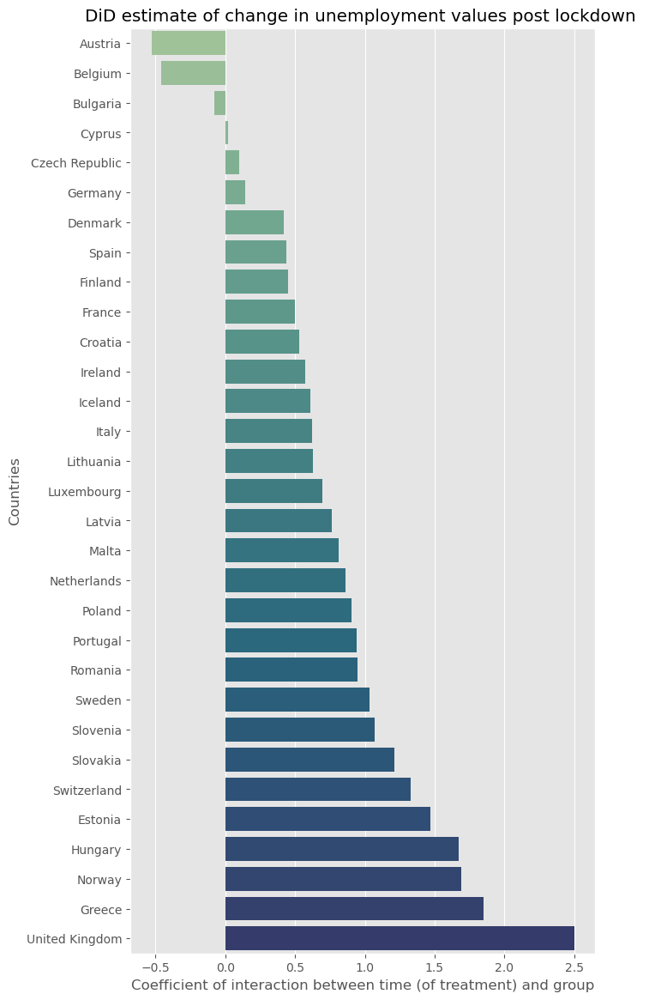

Did coefficient for Europe is: 0.7647311827956984


In [25]:
unemp_values = []
dftd=dftd[~(dftd['Country'].isin(['United States','Japan','Turkey']))]
for country in dftd['Country'].unique():
    dfcountry = dftd[dftd['Country']==country]
    dfcountry = split_group(dfcountry, '2019-01-01', '2019-07-01', '2020-01-01', '2020-07-01', '2019-03-01', '2020-03-01')
    lr = LinearRegression()
    X = dfcountry[['g', 't', 'gt']]
    y = dfcountry.Value
    lr.fit(X, y)
    unemp_values.append(lr.coef_[2]) 
unemp_values=np.sort(unemp_values)
plt.figure(figsize=(7,14))
sns.barplot(y=dftd['Country'].unique(),x=unemp_values,palette='crest')
plt.ylabel('Countries')
plt.xlabel('Coefficient of interaction between time (of treatment) and group')
plt.title('DiD estimate of change in unemployment values post lockdown ')
plt.savefig("did_unemployment.png", bbox_inches='tight')
plt.show()
print('Did coefficient for Europe is: '+str(np.mean(unemp_values)))

We observe a rise in unemployment due to the pandemic in almost all european countries. The average over all of europe is 0.76. We can assume that a rise in unemployment would increase the interest in the general population to find jobs, increasing therefore there safety need priority, as jobs play a big role in individual safety in our society.

# Wikipedia Pageviews

## General Description

In this section, we will see whether the pandemic has impacted the top 3 levels of Maslow's hierarchy : "Self-Actualization", "Esteem" and "Love & Belonging". We will go off the basis that people's view of the importance of these different aspects can be represented throught the number of wikipedia pageviews of different topics that are related to the three levels. This is a fair assumption, since unlike the base of the pyramid ("Physiological Needs" and "Safety Needs") which needs to be studied through more physical data (unemployement rates, mobility trends, grocery statistics...), online ressources are generally where people tend to look for information about more personal topics. This means that we can analyze the evolution of the need of these online ressouorces through the number of wikipedia pageviews for certain topics.

Our study is based in Europe, meaning that we will be web-scraping pageviews for different countries. Unfortunately, since wikipedia pageviews are language-based and not location based, this means that web-scraping for certain languages may not be representative of specific region depending on where that language is spoken elsewhere. For example, webscraping topics in english wouldn't be representative of any particular country or region, since the language is commonly used all over the world. Thus, languages would need to be selected carefully to have an accurate analysis of certain european countries.<br><br>
We have run some tests beforehand, and have selected the top 6 languages in terms of pageview numbers, while still compliying with the other criteria mentioned above.<br>

For this reason, we decided to web-scrape from six different languages :
- Italian ;
- Serbian ;
- Romanian ;
- Slovenian ;
- Finnish ;
- Danish.

Since these languages are for the most part spoken within their associated countries, this means that analyzing wikipedia pageviews of topics in these languages would give us an accurate analysis of the interests of people that are within these countries.

These six countries will serve as representation of Europe.

## Web-Scraping Wikipedia Pageviews

Now that the languages are determined, the next step is to choose a variety of topics corresponding to the top three levels of Maslow's hierarchy, such as selecting topics like "innovation" and "creativity" under the Self-Actualization category. However, this presents a particular challenge : not all topics can be found in all countries. To tackle this issue, our papproach was to find as much different topics generated in english that correspond to each of the top three levels of Maslow's hierarchy of needs: love/belonging, esteem, and self-actualization. 

We have set a goal for the number of topics that can be used in our analysis: 49 topics, which we judged would be a good representation of the real world. After checking for more than 5000 different topics in each category, we always found that in the 49 topics dound across all languages, 2-3 topics have missing pageview data in that specific language, in that case we would put the mean value of the pageviews in each month in that specific country and for that particular topic.

## Pageviews Datasets Format

To obtain pageviews for various topics across the six selected countries, we need to follow these steps :
- Generate topics in english using ChatGPT for all the top three levels of Maslow's hierarchy of needs
- Get a list of only valid topics that can be found using the Wikipedia API
- Translate the valid topics in the desired languages and save only the ones that have a translation in all the languages
- For each language/country, get the monthly pageviews count of all the topics

Using these steps, we create dataframes that have a 'Timestamp' Column, which contain the monthly date for which we webscrape (from 2019-01-01 to 2020-08-01). There is also a column for each topic, with each cell containing the number of pageviews for the corresponding month within the timestamp column.

## Code for different analyses 

Now that the CSV files for the different levels and countries have been generated using the "web_scraping.ipynb" notebook, we will now move onto to an introductory anlysis of these datasets, by considering each level separately, as well as following a particular pipeline that will be the same for each level. It is important to note that the following pipeline is not a conclusive analysis, but rather a way to have a better initial idea of the evolution of the number of pageviews before and aftercertain lockdown procedures.

### Introductory Analysis Pipeline :
1) Loading pageview dataframes ;
2) Lineplots of the number of pageviews over time (from 2019-01-01 to 2020-08-01) for each individual topic ;
3) Filtering out outliers ;
4) Redo lineplots without outliers for better visualizations ;
5) Create new dataframes from the original ones that correspond to the relative percentage change from baseline (with the baseline being set as the first month) of the number of pageviews for each month ; 
6) Lineplots of the evolution of the relative percentage from baseline ;
7) Filtering out outliers ;
8) Redo lineplots without outliers for better visualizations ;
9) Lineplots of the average of the relative perentage change from baseline of all the topics tpgether for each country ;
10) Lineplot of the averaging all countries together.

These variables will be needed further on in the analysis.

In [56]:
# Region code of the different countries
lan = ['it', 'cs', 'ro', 'sv', 'fi', 'da']

# Name of the countries
countries = ['Italy', 'Serbia', 'Romania', 'Slovenia', 'Finland', 'Denmark']

### Self-Actualization

The "dfsSelf" variable within the cell below is a structure with six field contains 6 dataframes, one for each language, and each containing the number of pageveiews fo different topics of self_actualization (the topics are the same across the 6 dataframes). The format of dfsSelf is the following :

<pre>
dfsSelf = {
        "it": [], 
        "cs": [],
        "ro": [],
        "sv": [],
        "fi": [],
        "da": [],
        }
</pre>

In [57]:
# Step 1)
dfsSelf = get_dfs('self_actualization')

In the below cell, we show an example of how to access a dataframe of a specific country as well as what one of these dataframes looks like ; we will do this for topics in Italian :

In [58]:
# Accessing the 'it' field of the structure and displaying the dataframe
display(dfsSelf['it'])

,Timestamp,Innovazione,Immaginazione,Estetica,Produttività,Motivazione,Genio,Creatività,Simbiosi,Catalizzatore,...,Cottura,Lettura,Scrittura,Umorismo,Cultura,Educazione,Salute,Altruismo,Indipendenza,Filantropia
0,2019-01-01,1790,1682,7730,5308,148,807,5308,3061,7276,...,1814,2076,3951,4444,11640,5973,5322,2346,2204,10076
1,2019-02-01,1727,1712,7355,4581,123,515,4581,3001,7307,...,1857,1847,3026,3749,10437,5546,4601,1933,1311,7958
2,2019-03-01,1631,1652,6489,4941,194,538,4941,2980,6831,...,1767,1782,2904,3904,13449,5319,6756,2001,1398,8427
3,2019-04-01,1480,1420,6164,4585,157,495,4585,2744,5824,...,1662,1647,2552,3623,16030,4678,5148,1649,1218,7470
4,2019-05-01,1763,1387,7039,4879,144,603,4879,2519,7829,...,2107,1456,2603,3337,13875,5363,5608,1631,1328,8546
5,2019-06-01,1364,1211,6600,4011,143,746,4011,1798,5162,...,1456,1201,2120,3288,9542,4592,4880,1686,1097,7385
6,2019-07-01,1601,1072,5728,3533,115,358,3533,1793,4698,...,1230,1252,2279,2658,8449,4179,4074,1656,1039,7587
7,2019-08-01,910,1243,4904,3414,92,314,3414,1548,4599,...,1319,1147,2347,2606,7029,3885,3473,1702,1148,7001
8,2019-09-01,1518,1372,8453,5087,163,392,5087,1931,4994,...,1378,1694,3127,2672,11205,5586,5399,1879,1204,7524
9,2019-10-01,1803,1583,7808,5409,170,317,5409,2581,6028,...,1671,2328,4210,3048,12357,6218,7751,2086,1399,8798


c:\Users\alyel\Desktop\ADA MAIN COPY FINAL\ada-2023-project-bobeast\helpers.py:347: UserWarning:

FixedFormatter should only be used together with FixedLocator

c:\Users\alyel\Desktop\ADA MAIN COPY FINAL\ada-2023-project-bobeast\helpers.py:347: UserWarning:

FixedFormatter should only be used together with FixedLocator

c:\Users\alyel\Desktop\ADA MAIN COPY FINAL\ada-2023-project-bobeast\helpers.py:347: UserWarning:

FixedFormatter should only be used together with FixedLocator

c:\Users\alyel\Desktop\ADA MAIN COPY FINAL\ada-2023-project-bobeast\helpers.py:347: UserWarning:

FixedFormatter should only be used together with FixedLocator

c:\Users\alyel\Desktop\ADA MAIN COPY FINAL\ada-2023-project-bobeast\helpers.py:347: UserWarning:

FixedFormatter should only be used together with FixedLocator

c:\Users\alyel\Desktop\ADA MAIN COPY FINAL\ada-2023-project-bobeast\helpers.py:347: UserWarning:

FixedFormatter should only be used together with FixedLocator



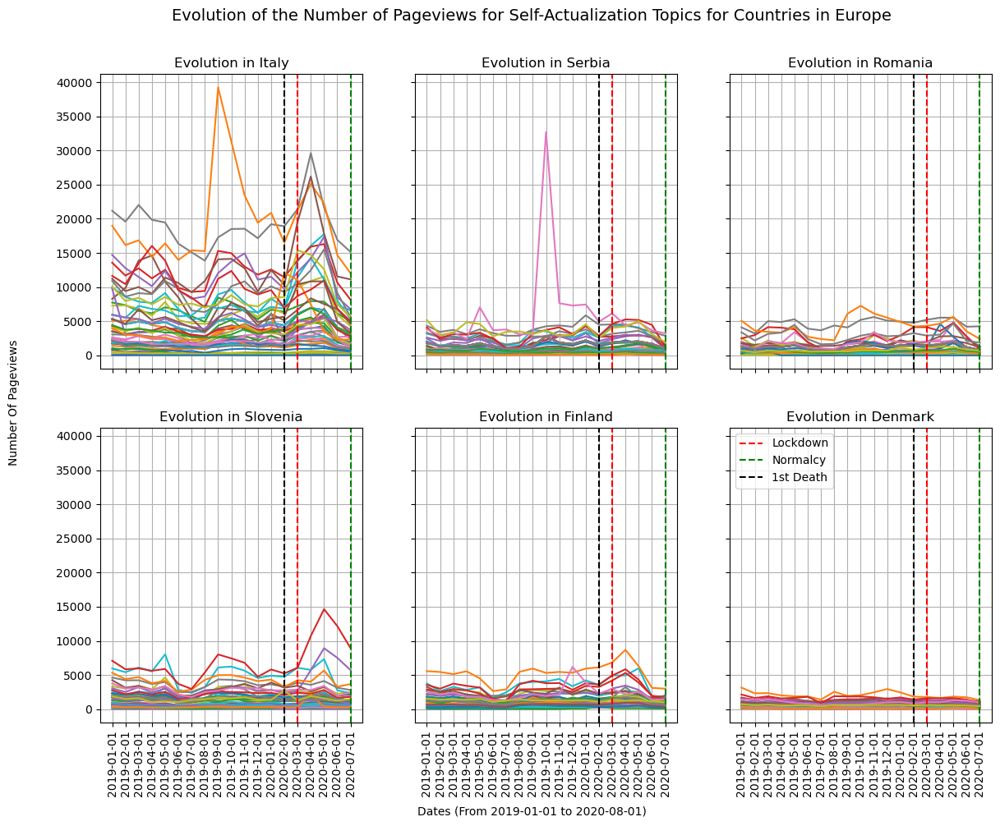

In [59]:
# Step 2)
plot_df_countries(dfsSelf,
                  'Number Of Pageviews', 'Evolution of the Number of Pageviews for Self-Actualization Topics for Countries in Europe')

We can see that there are outliers that prevent us from having a more in depth view of the plots. Let's filter them out!

c:\Users\alyel\Desktop\ADA MAIN COPY FINAL\ada-2023-project-bobeast\helpers.py:347: UserWarning:

FixedFormatter should only be used together with FixedLocator

c:\Users\alyel\Desktop\ADA MAIN COPY FINAL\ada-2023-project-bobeast\helpers.py:347: UserWarning:

FixedFormatter should only be used together with FixedLocator

c:\Users\alyel\Desktop\ADA MAIN COPY FINAL\ada-2023-project-bobeast\helpers.py:347: UserWarning:

FixedFormatter should only be used together with FixedLocator

c:\Users\alyel\Desktop\ADA MAIN COPY FINAL\ada-2023-project-bobeast\helpers.py:347: UserWarning:

FixedFormatter should only be used together with FixedLocator

c:\Users\alyel\Desktop\ADA MAIN COPY FINAL\ada-2023-project-bobeast\helpers.py:347: UserWarning:

FixedFormatter should only be used together with FixedLocator

c:\Users\alyel\Desktop\ADA MAIN COPY FINAL\ada-2023-project-bobeast\helpers.py:347: UserWarning:

FixedFormatter should only be used together with FixedLocator



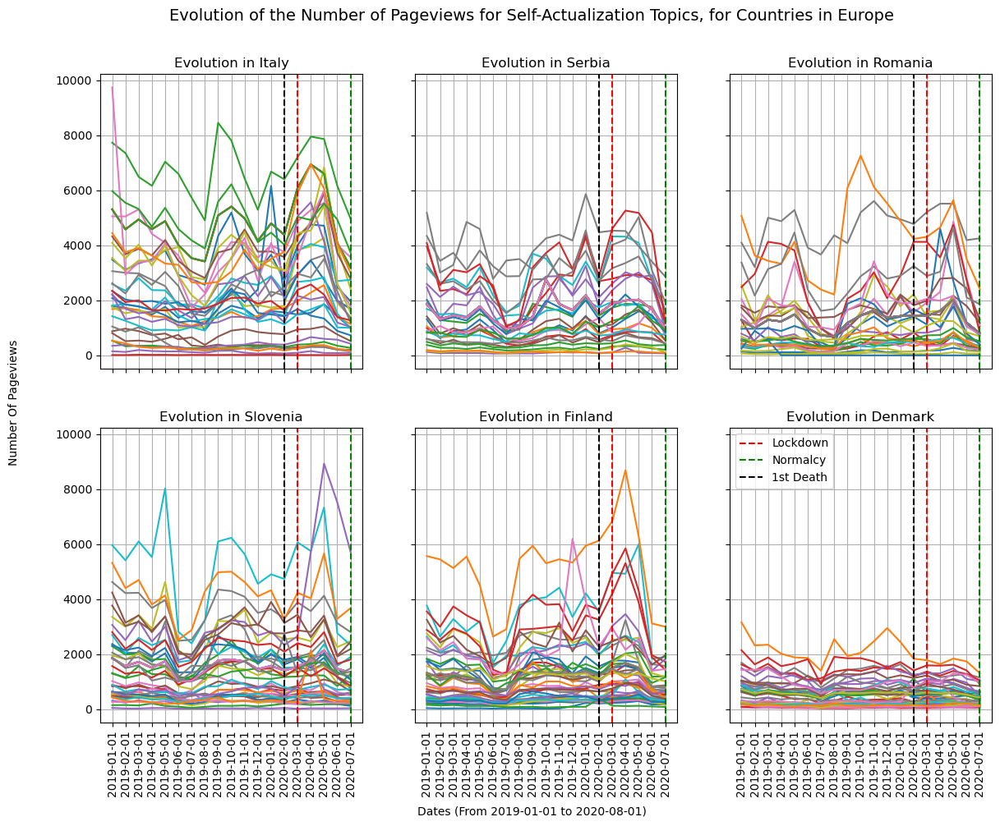

In [60]:
# Step 3)
dfsSelfFiltered = {
        "it": [], 
        "cs": [],
        "ro": [],
        "sv": [],
        "fi": [],
        "da": [],
        }

for i in range(len(lan)) :
    dfFiltered = filter_outlier(dfsSelf[lan[i]], 10000).copy()
    dfsSelfFiltered[lan[i]] = dfFiltered

# Step 4)
plot_df_countries(dfsSelfFiltered,
                  'Number Of Pageviews', 'Evolution of the Number of Pageviews for Self-Actualization Topics, for Countries in Europe')

To get a better idea, we will create dataframes containing the relative percentage change from baseline of the previous dataframes, and also observe the evolution of the averaging of all the different topics for different countries.

c:\Users\alyel\Desktop\ADA MAIN COPY FINAL\ada-2023-project-bobeast\helpers.py:347: UserWarning:

FixedFormatter should only be used together with FixedLocator

c:\Users\alyel\Desktop\ADA MAIN COPY FINAL\ada-2023-project-bobeast\helpers.py:347: UserWarning:

FixedFormatter should only be used together with FixedLocator

c:\Users\alyel\Desktop\ADA MAIN COPY FINAL\ada-2023-project-bobeast\helpers.py:347: UserWarning:

FixedFormatter should only be used together with FixedLocator

c:\Users\alyel\Desktop\ADA MAIN COPY FINAL\ada-2023-project-bobeast\helpers.py:347: UserWarning:

FixedFormatter should only be used together with FixedLocator

c:\Users\alyel\Desktop\ADA MAIN COPY FINAL\ada-2023-project-bobeast\helpers.py:347: UserWarning:

FixedFormatter should only be used together with FixedLocator

c:\Users\alyel\Desktop\ADA MAIN COPY FINAL\ada-2023-project-bobeast\helpers.py:347: UserWarning:

FixedFormatter should only be used together with FixedLocator



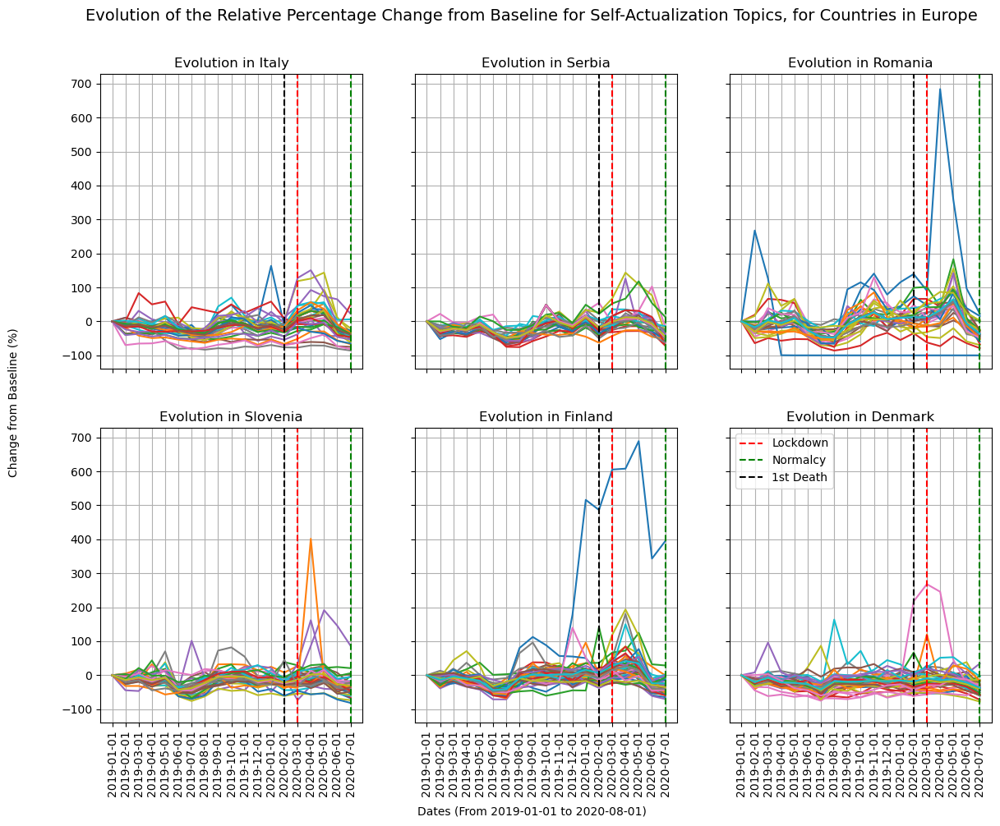

In [61]:
# Step 5)
dfsSelfBaseline = {
        "it": [], 
        "cs": [],
        "ro": [],
        "sv": [],
        "fi": [],
        "da": [],
        }

for i in range(len(lan)) :
    dfBase = rel_change_from_baseline(dfsSelfFiltered[lan[i]]).copy()
    dfsSelfBaseline[lan[i]] = dfBase

# Step 6)
plot_df_countries(dfsSelfBaseline, 'Change from Baseline (%)', 
                  'Evolution of the Relative Percentage Change from Baseline for Self-Actualization Topics, for Countries in Europe')

Again, we'll filter out some outliers from the baseline dataframes.

c:\Users\alyel\Desktop\ADA MAIN COPY FINAL\ada-2023-project-bobeast\helpers.py:347: UserWarning:

FixedFormatter should only be used together with FixedLocator

c:\Users\alyel\Desktop\ADA MAIN COPY FINAL\ada-2023-project-bobeast\helpers.py:347: UserWarning:

FixedFormatter should only be used together with FixedLocator

c:\Users\alyel\Desktop\ADA MAIN COPY FINAL\ada-2023-project-bobeast\helpers.py:347: UserWarning:

FixedFormatter should only be used together with FixedLocator

c:\Users\alyel\Desktop\ADA MAIN COPY FINAL\ada-2023-project-bobeast\helpers.py:347: UserWarning:

FixedFormatter should only be used together with FixedLocator

c:\Users\alyel\Desktop\ADA MAIN COPY FINAL\ada-2023-project-bobeast\helpers.py:347: UserWarning:

FixedFormatter should only be used together with FixedLocator

c:\Users\alyel\Desktop\ADA MAIN COPY FINAL\ada-2023-project-bobeast\helpers.py:347: UserWarning:

FixedFormatter should only be used together with FixedLocator



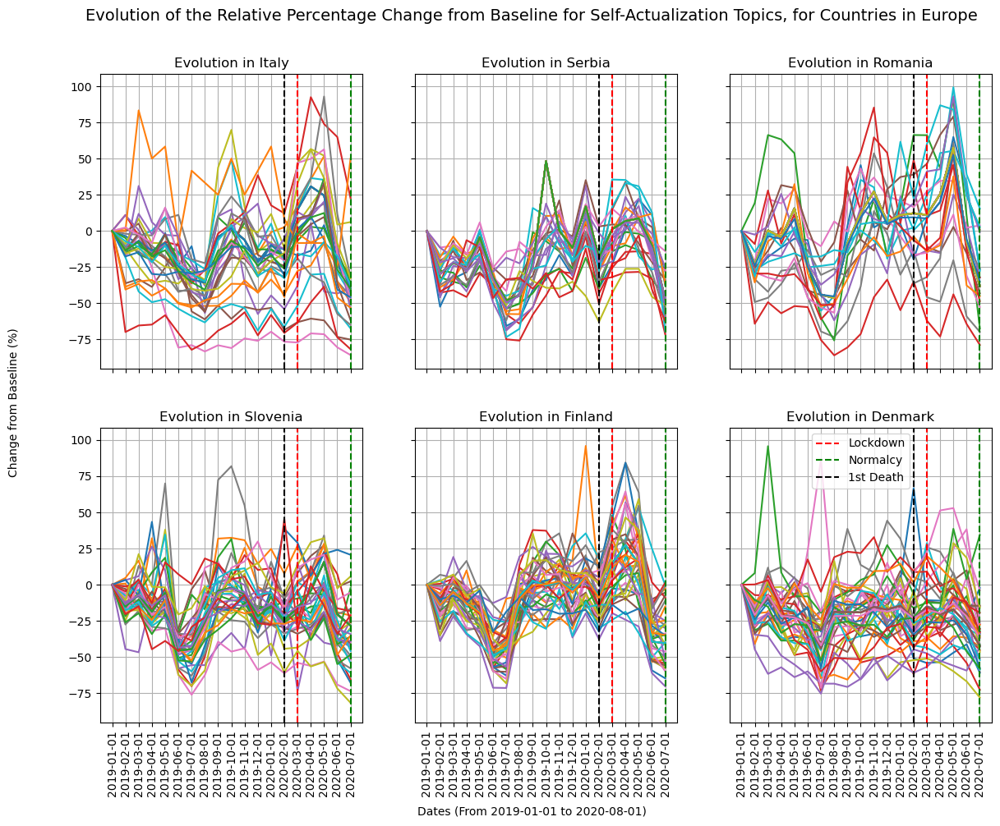

In [62]:
# Step 7)
dfsSelfBaseFiltered = {
        "it": [], 
        "cs": [],
        "ro": [],
        "sv": [],
        "fi": [],
        "da": [],
        }

for i in range(len(lan)) :
        dfFiltered = filter_outlier(dfsSelfBaseline[lan[i]], 100).copy()
        dfsSelfBaseFiltered[lan[i]] = dfFiltered

# Step 8)
plot_df_countries(dfsSelfBaseFiltered, 'Change from Baseline (%)', 
                  'Evolution of the Relative Percentage Change from Baseline for Self-Actualization Topics, for Countries in Europe')


Now we'll view the averaging of all the different topics for all countries.

In [63]:
# Step 9)
one_plot_avg_px (dfsSelfBaseFiltered,
 'Evolution of the Average of the Relative Percentage Change from Baseline for Each country for Self-Actualization Topics')

In the above graph, we can see that there seems to be a general trend upwards for most countries straight after the months corresponding to the first covid death as well as the lockdown implementation month. This would seem to indicate that Covid-19 has increased the number of pageviews when it comes to Self & Actualization topics. Now, in order to have a view general of europe through these countries specifically, we'll average out all of the datafarmes together in the code below and observe the results.

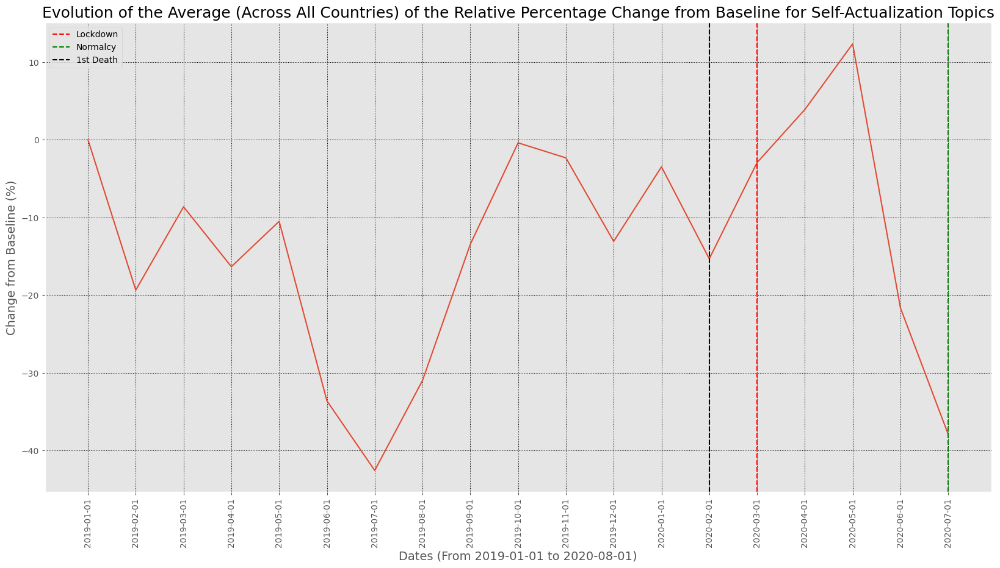

In [34]:
# Step 10)
dfSelfAll = dfsSelf['it'].copy()
dfSelfAll = dfSelfAll.iloc[:, [0]]

for key, value in dfsSelfBaseFiltered.items():
    dfSelfAll[key] = value['avg']

dfSelfAll['avg_tot'] = (dfSelfAll.iloc[:, 1:]).mean(axis=1)

title = \
    'Evolution of the Average (Across All Countries) of the Relative Percentage Change from Baseline for Self-Actualization Topics'

plot_df(dfSelfAll[['Timestamp', 'avg_tot']], 'Change from Baseline (%)', title)

In the above plot, this shift upwards seems more prevalent, but in order to have a more conclusive analysis, we will need to perform a differences in differences analysis, which will be done at the end of this section.

We will now do the same analysis, but for Esteem topics, and then for Love & Belonging topics.

### Esteem 

The analysis in this subsection is analogous to the previous one.

In [65]:
# Step 1)
dfsEsteem = get_dfs('esteem')

c:\Users\alyel\Desktop\ADA MAIN COPY FINAL\ada-2023-project-bobeast\helpers.py:347: UserWarning:

FixedFormatter should only be used together with FixedLocator

c:\Users\alyel\Desktop\ADA MAIN COPY FINAL\ada-2023-project-bobeast\helpers.py:347: UserWarning:

FixedFormatter should only be used together with FixedLocator

c:\Users\alyel\Desktop\ADA MAIN COPY FINAL\ada-2023-project-bobeast\helpers.py:347: UserWarning:

FixedFormatter should only be used together with FixedLocator

c:\Users\alyel\Desktop\ADA MAIN COPY FINAL\ada-2023-project-bobeast\helpers.py:347: UserWarning:

FixedFormatter should only be used together with FixedLocator

c:\Users\alyel\Desktop\ADA MAIN COPY FINAL\ada-2023-project-bobeast\helpers.py:347: UserWarning:

FixedFormatter should only be used together with FixedLocator

c:\Users\alyel\Desktop\ADA MAIN COPY FINAL\ada-2023-project-bobeast\helpers.py:347: UserWarning:

FixedFormatter should only be used together with FixedLocator



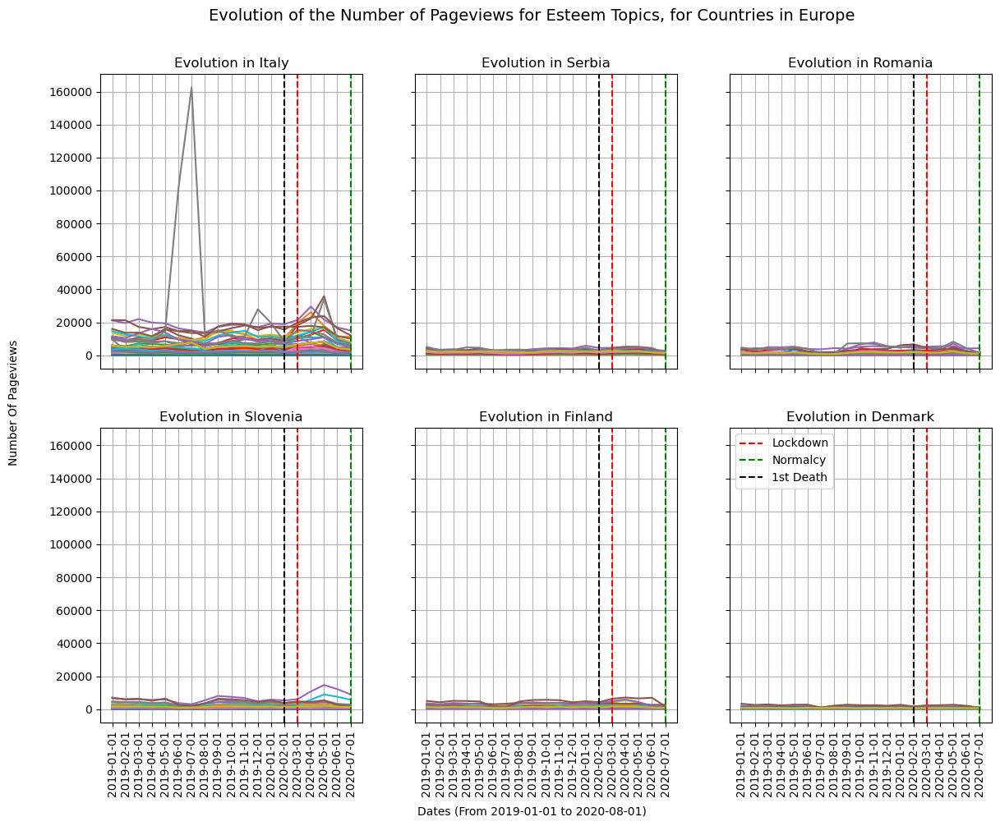

In [66]:
# Step 2)
plot_df_countries(dfsEsteem,
                  'Number Of Pageviews', 'Evolution of the Number of Pageviews for Esteem Topics, for Countries in Europe')

We can see that there are outliers that prevent us from having a more in depth view of the plots. Let's filter them out!

c:\Users\alyel\Desktop\ADA MAIN COPY FINAL\ada-2023-project-bobeast\helpers.py:347: UserWarning:

FixedFormatter should only be used together with FixedLocator

c:\Users\alyel\Desktop\ADA MAIN COPY FINAL\ada-2023-project-bobeast\helpers.py:347: UserWarning:

FixedFormatter should only be used together with FixedLocator

c:\Users\alyel\Desktop\ADA MAIN COPY FINAL\ada-2023-project-bobeast\helpers.py:347: UserWarning:

FixedFormatter should only be used together with FixedLocator

c:\Users\alyel\Desktop\ADA MAIN COPY FINAL\ada-2023-project-bobeast\helpers.py:347: UserWarning:

FixedFormatter should only be used together with FixedLocator

c:\Users\alyel\Desktop\ADA MAIN COPY FINAL\ada-2023-project-bobeast\helpers.py:347: UserWarning:

FixedFormatter should only be used together with FixedLocator

c:\Users\alyel\Desktop\ADA MAIN COPY FINAL\ada-2023-project-bobeast\helpers.py:347: UserWarning:

FixedFormatter should only be used together with FixedLocator



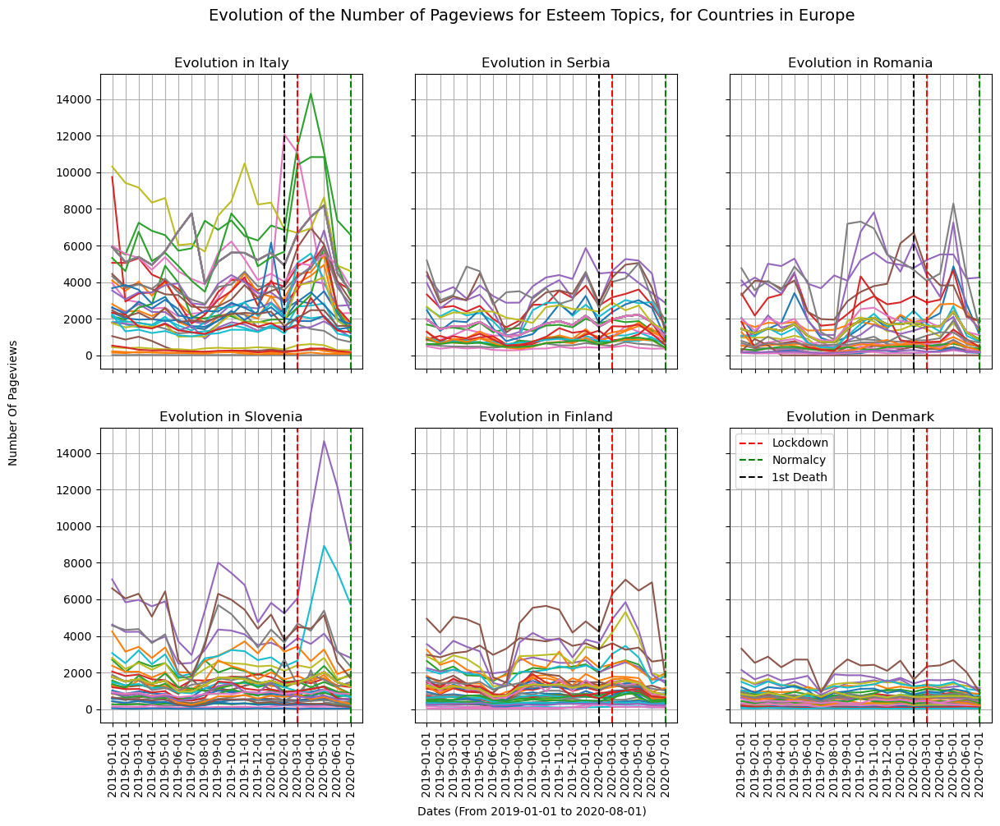

In [67]:
# Step 3)
dfsEsteemFiltered = {
        "it": [], 
        "cs": [],
        "ro": [],
        "sv": [],
        "fi": [],
        "da": [],
        }

for i in range(len(lan)) :
    dfFiltered = filter_outlier(dfsEsteem[lan[i]], 15000).copy()
    dfsEsteemFiltered[lan[i]] = dfFiltered

# Step 4)
plot_df_countries(dfsEsteemFiltered, 'Number Of Pageviews',
                  'Evolution of the Number of Pageviews for Esteem Topics, for Countries in Europe')

To get a better idea, we will create dataframes containing the relative percentage change from baseline of the previous dataframes, and also observe the evolution of the averaging of all the different topics for different countries.

c:\Users\alyel\Desktop\ADA MAIN COPY FINAL\ada-2023-project-bobeast\helpers.py:347: UserWarning:

FixedFormatter should only be used together with FixedLocator

c:\Users\alyel\Desktop\ADA MAIN COPY FINAL\ada-2023-project-bobeast\helpers.py:347: UserWarning:

FixedFormatter should only be used together with FixedLocator

c:\Users\alyel\Desktop\ADA MAIN COPY FINAL\ada-2023-project-bobeast\helpers.py:347: UserWarning:

FixedFormatter should only be used together with FixedLocator

c:\Users\alyel\Desktop\ADA MAIN COPY FINAL\ada-2023-project-bobeast\helpers.py:347: UserWarning:

FixedFormatter should only be used together with FixedLocator

c:\Users\alyel\Desktop\ADA MAIN COPY FINAL\ada-2023-project-bobeast\helpers.py:347: UserWarning:

FixedFormatter should only be used together with FixedLocator

c:\Users\alyel\Desktop\ADA MAIN COPY FINAL\ada-2023-project-bobeast\helpers.py:347: UserWarning:

FixedFormatter should only be used together with FixedLocator



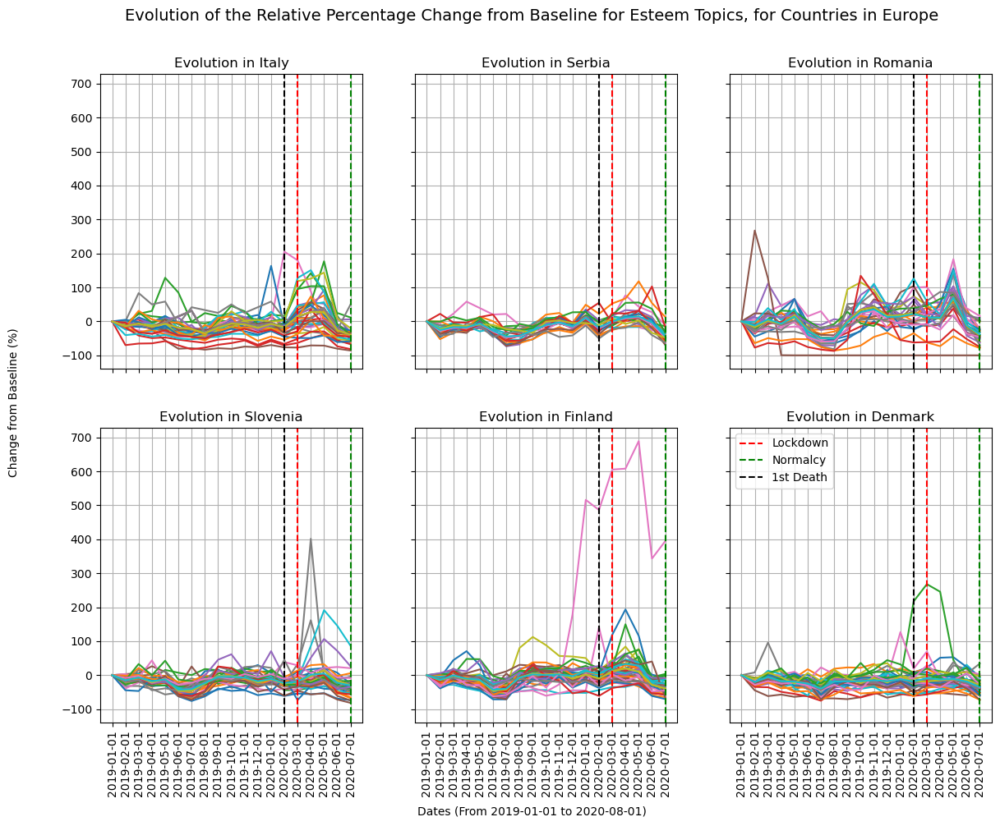

In [68]:
# Step 5)
dfsEsteemBaseline = {
        "it": [], 
        "cs": [],
        "ro": [],
        "sv": [],
        "fi": [],
        "da": [],
        }

for i in range(len(lan)) :
    dfBase = rel_change_from_baseline(dfsEsteemFiltered[lan[i]]).copy()
    dfsEsteemBaseline[lan[i]] = dfBase

# Step 6)
plot_df_countries(dfsEsteemBaseline, 'Change from Baseline (%)', 
                  'Evolution of the Relative Percentage Change from Baseline for Esteem Topics, for Countries in Europe')

Again, we'll filter some outliers from the baseline dataframes.

c:\Users\alyel\Desktop\ADA MAIN COPY FINAL\ada-2023-project-bobeast\helpers.py:347: UserWarning:

FixedFormatter should only be used together with FixedLocator

c:\Users\alyel\Desktop\ADA MAIN COPY FINAL\ada-2023-project-bobeast\helpers.py:347: UserWarning:

FixedFormatter should only be used together with FixedLocator

c:\Users\alyel\Desktop\ADA MAIN COPY FINAL\ada-2023-project-bobeast\helpers.py:347: UserWarning:

FixedFormatter should only be used together with FixedLocator

c:\Users\alyel\Desktop\ADA MAIN COPY FINAL\ada-2023-project-bobeast\helpers.py:347: UserWarning:

FixedFormatter should only be used together with FixedLocator

c:\Users\alyel\Desktop\ADA MAIN COPY FINAL\ada-2023-project-bobeast\helpers.py:347: UserWarning:

FixedFormatter should only be used together with FixedLocator

c:\Users\alyel\Desktop\ADA MAIN COPY FINAL\ada-2023-project-bobeast\helpers.py:347: UserWarning:

FixedFormatter should only be used together with FixedLocator



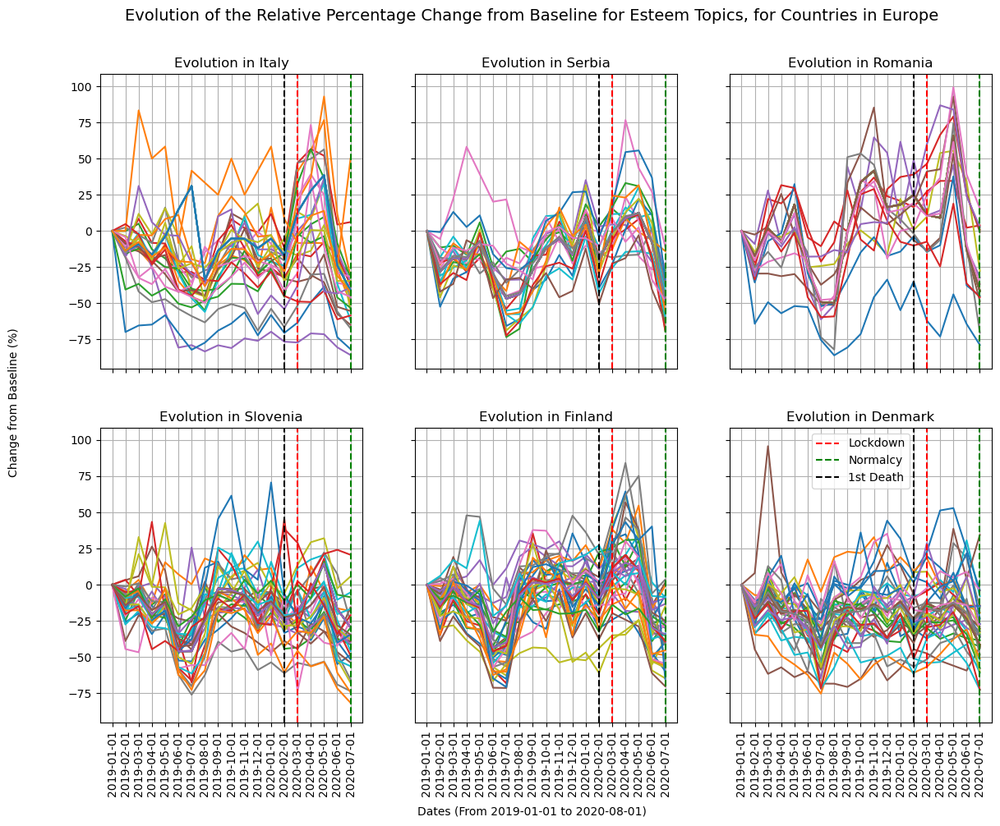

In [69]:
# Step 7)
dfsEsteemBaseFiltered = {
        "it": [], 
        "cs": [],
        "ro": [],
        "sv": [],
        "fi": [],
        "da": [],
        }

for i in range(len(lan)) :
        dfFiltered = filter_outlier(dfsEsteemBaseline[lan[i]], 100).copy()
        dfsEsteemBaseFiltered[lan[i]] = dfFiltered

# Step 8)
plot_df_countries(dfsEsteemBaseFiltered, 'Change from Baseline (%)', 
                  'Evolution of the Relative Percentage Change from Baseline for Esteem Topics, for Countries in Europe')


Now we will view the averaging of all the different topics for all countries.

In [70]:
# Step 9)
one_plot_avg_px (dfsEsteemBaseFiltered,
 'Evolution of the Average of the Relative Percentage Change from Baseline for Each country for Esteem Topics')

In the above graph, we can see that there seems to be a general trend upwards for most countries straight after the months corresponding to the first covid death as well as the lockdown implementation month. This would seem to indicate that Covid-19 has increased the number of pageviews when it comes to Esteem topics. Now, in order to have a view general of europe through these countries specifically, we'll average out all of the datafarmes together in the code below and observe the results.

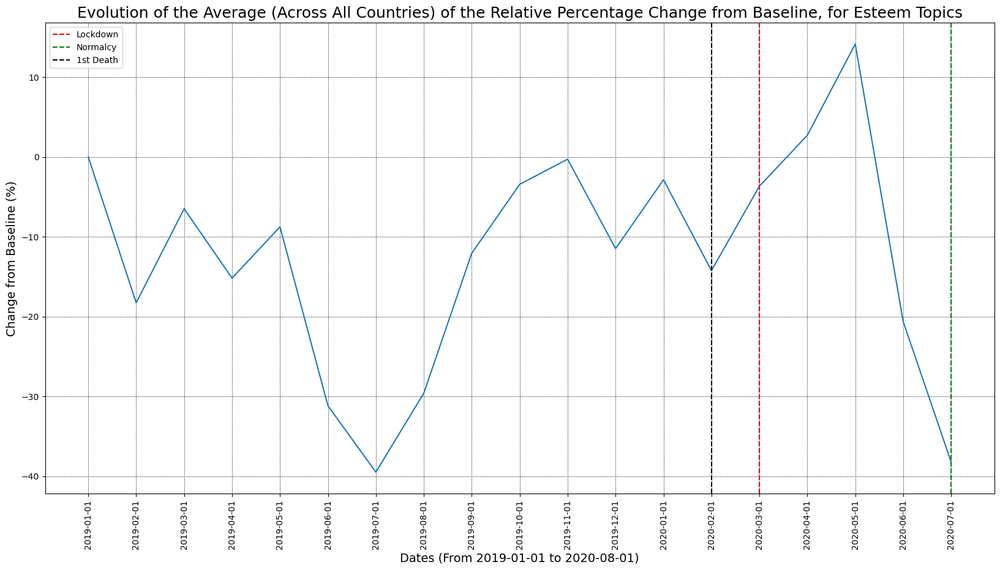

In [71]:
# Step 10)
dfEsteemAll = dfsEsteem['it'].copy()
dfEsteemAll = dfEsteemAll.iloc[:, [0]]

for key, value in dfsEsteemBaseFiltered.items():
    dfEsteemAll[key] = value['avg']

dfEsteemAll['avg_tot'] = (dfEsteemAll.iloc[:, 1:]).mean(axis=1)

title =\
    'Evolution of the Average (Across All Countries) of the Relative Percentage Change from Baseline, for Esteem Topics'

plot_df(dfEsteemAll[['Timestamp', 'avg_tot']], 'Change from Baseline (%)', title)

In the above plot, this shift upwards seems more prevalent, but in order to have a more conclusive analysis, we will need to perform a differences in differences analysis, which will be done at the end of this section.

### Love & Belonging

The analysis in this subsection is analogous to the previous one.

In [72]:
# Step 1)
dfsLove = get_dfs('love_belonging')

c:\Users\alyel\Desktop\ADA MAIN COPY FINAL\ada-2023-project-bobeast\helpers.py:347: UserWarning:

FixedFormatter should only be used together with FixedLocator

c:\Users\alyel\Desktop\ADA MAIN COPY FINAL\ada-2023-project-bobeast\helpers.py:347: UserWarning:

FixedFormatter should only be used together with FixedLocator

c:\Users\alyel\Desktop\ADA MAIN COPY FINAL\ada-2023-project-bobeast\helpers.py:347: UserWarning:

FixedFormatter should only be used together with FixedLocator

c:\Users\alyel\Desktop\ADA MAIN COPY FINAL\ada-2023-project-bobeast\helpers.py:347: UserWarning:

FixedFormatter should only be used together with FixedLocator

c:\Users\alyel\Desktop\ADA MAIN COPY FINAL\ada-2023-project-bobeast\helpers.py:347: UserWarning:

FixedFormatter should only be used together with FixedLocator

c:\Users\alyel\Desktop\ADA MAIN COPY FINAL\ada-2023-project-bobeast\helpers.py:347: UserWarning:

FixedFormatter should only be used together with FixedLocator



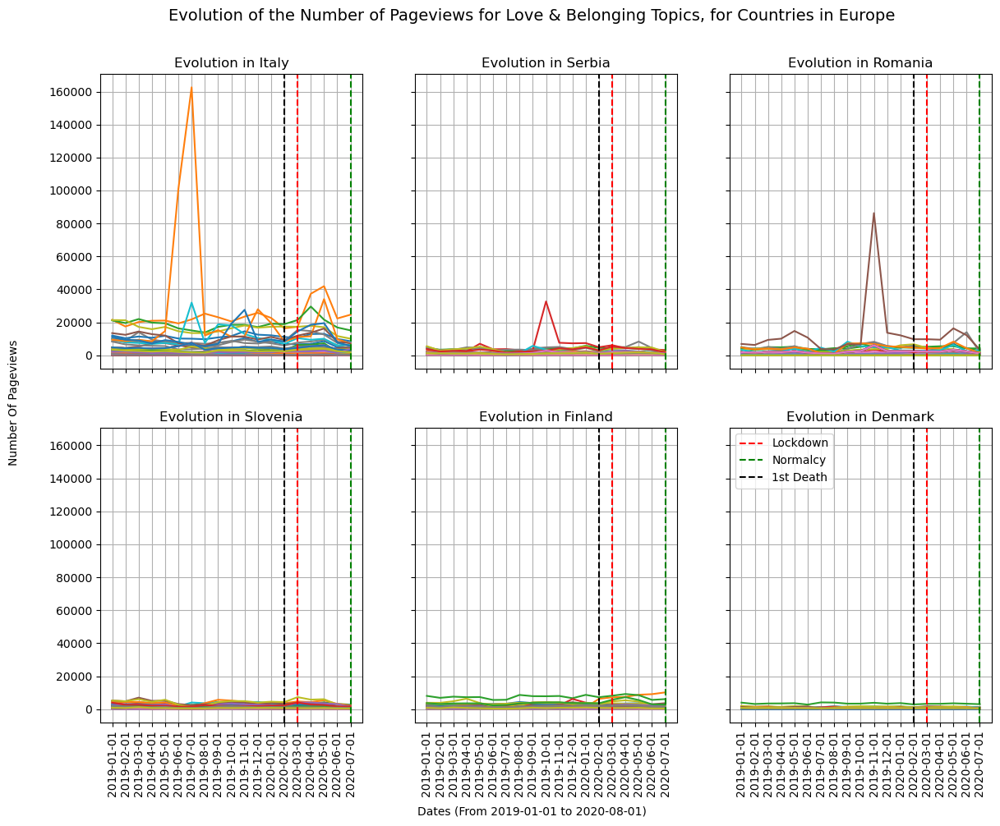

In [73]:
# Step 2)
plot_df_countries(dfsLove, 'Number Of Pageviews',
                  'Evolution of the Number of Pageviews for Love & Belonging Topics, for Countries in Europe')

We can see that there are outliers that prevent us from having a more in depth view of the plots. Let's filter them out!

c:\Users\alyel\Desktop\ADA MAIN COPY FINAL\ada-2023-project-bobeast\helpers.py:347: UserWarning:

FixedFormatter should only be used together with FixedLocator

c:\Users\alyel\Desktop\ADA MAIN COPY FINAL\ada-2023-project-bobeast\helpers.py:347: UserWarning:

FixedFormatter should only be used together with FixedLocator

c:\Users\alyel\Desktop\ADA MAIN COPY FINAL\ada-2023-project-bobeast\helpers.py:347: UserWarning:

FixedFormatter should only be used together with FixedLocator

c:\Users\alyel\Desktop\ADA MAIN COPY FINAL\ada-2023-project-bobeast\helpers.py:347: UserWarning:

FixedFormatter should only be used together with FixedLocator

c:\Users\alyel\Desktop\ADA MAIN COPY FINAL\ada-2023-project-bobeast\helpers.py:347: UserWarning:

FixedFormatter should only be used together with FixedLocator

c:\Users\alyel\Desktop\ADA MAIN COPY FINAL\ada-2023-project-bobeast\helpers.py:347: UserWarning:

FixedFormatter should only be used together with FixedLocator



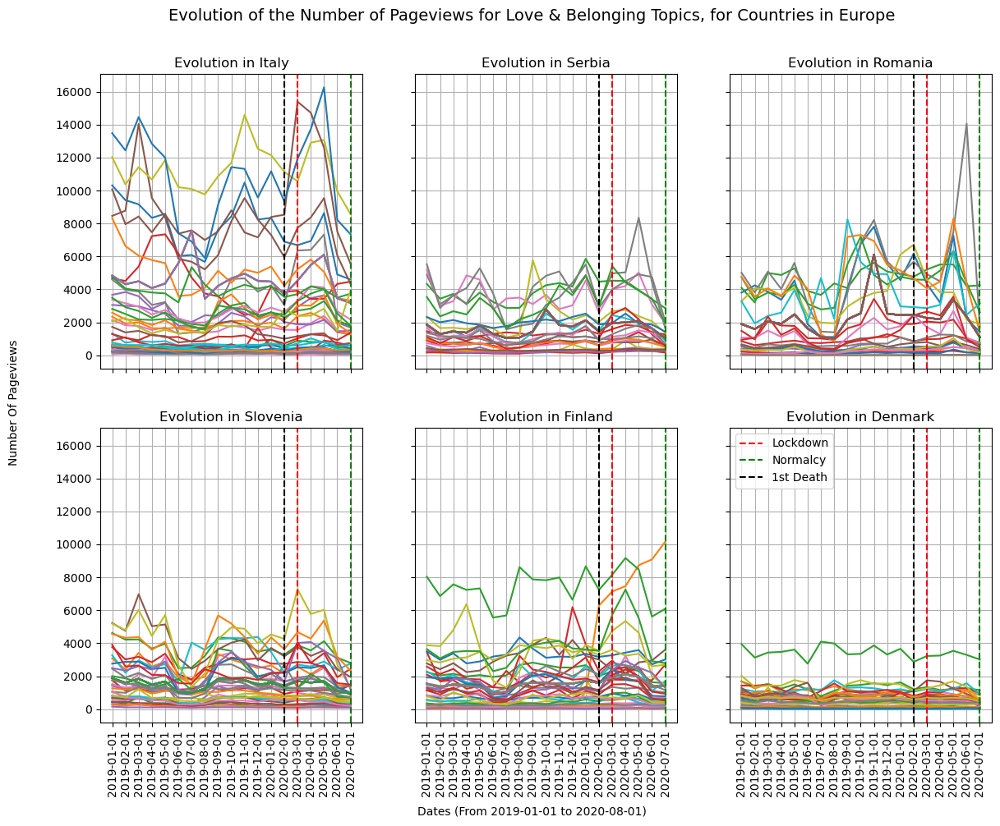

In [74]:
# Step 3)
dfsLoveFiltered = {
        "it": [], 
        "cs": [],
        "ro": [],
        "sv": [],
        "fi": [],
        "da": [],
        }

for i in range(len(lan)) :
    dfFiltered = filter_outlier(dfsLove[lan[i]], 20000).copy()
    dfsLoveFiltered[lan[i]] = dfFiltered

# Step 4)
plot_df_countries(dfsLoveFiltered, 'Number Of Pageviews',
                  'Evolution of the Number of Pageviews for Love & Belonging Topics, for Countries in Europe')

To get a better idea, we will create dataframes containing the relative percentage change from baseline of the previous dataframes, and also observe the evolution of the averaging of all the different topics for different countries.

c:\Users\alyel\Desktop\ADA MAIN COPY FINAL\ada-2023-project-bobeast\helpers.py:347: UserWarning:

FixedFormatter should only be used together with FixedLocator

c:\Users\alyel\Desktop\ADA MAIN COPY FINAL\ada-2023-project-bobeast\helpers.py:347: UserWarning:

FixedFormatter should only be used together with FixedLocator

c:\Users\alyel\Desktop\ADA MAIN COPY FINAL\ada-2023-project-bobeast\helpers.py:347: UserWarning:

FixedFormatter should only be used together with FixedLocator

c:\Users\alyel\Desktop\ADA MAIN COPY FINAL\ada-2023-project-bobeast\helpers.py:347: UserWarning:

FixedFormatter should only be used together with FixedLocator

c:\Users\alyel\Desktop\ADA MAIN COPY FINAL\ada-2023-project-bobeast\helpers.py:347: UserWarning:

FixedFormatter should only be used together with FixedLocator

c:\Users\alyel\Desktop\ADA MAIN COPY FINAL\ada-2023-project-bobeast\helpers.py:347: UserWarning:

FixedFormatter should only be used together with FixedLocator



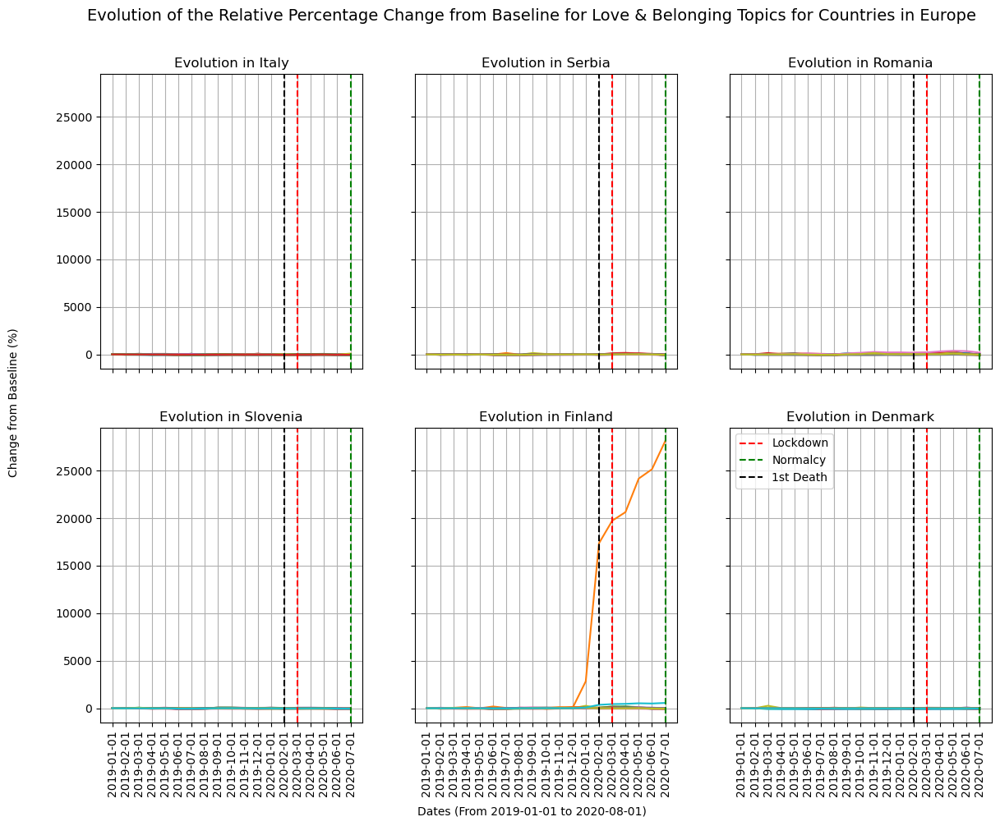

In [75]:
# Step 5)
dfsLoveBaseline = {
        "it": [], 
        "cs": [],
        "ro": [],
        "sv": [],
        "fi": [],
        "da": [],
        }

for i in range(len(lan)) :
    dfBase = rel_change_from_baseline(dfsLoveFiltered[lan[i]]).copy()
    dfsLoveBaseline[lan[i]] = dfBase

# Step 6)
plot_df_countries(dfsLoveBaseline, 'Change from Baseline (%)', 
                  'Evolution of the Relative Percentage Change from Baseline for Love & Belonging Topics for Countries in Europe')

Again, we'll filter some outliers from the baseline dataframes.

c:\Users\alyel\Desktop\ADA MAIN COPY FINAL\ada-2023-project-bobeast\helpers.py:347: UserWarning:

FixedFormatter should only be used together with FixedLocator

c:\Users\alyel\Desktop\ADA MAIN COPY FINAL\ada-2023-project-bobeast\helpers.py:347: UserWarning:

FixedFormatter should only be used together with FixedLocator

c:\Users\alyel\Desktop\ADA MAIN COPY FINAL\ada-2023-project-bobeast\helpers.py:347: UserWarning:

FixedFormatter should only be used together with FixedLocator

c:\Users\alyel\Desktop\ADA MAIN COPY FINAL\ada-2023-project-bobeast\helpers.py:347: UserWarning:

FixedFormatter should only be used together with FixedLocator

c:\Users\alyel\Desktop\ADA MAIN COPY FINAL\ada-2023-project-bobeast\helpers.py:347: UserWarning:

FixedFormatter should only be used together with FixedLocator

c:\Users\alyel\Desktop\ADA MAIN COPY FINAL\ada-2023-project-bobeast\helpers.py:347: UserWarning:

FixedFormatter should only be used together with FixedLocator



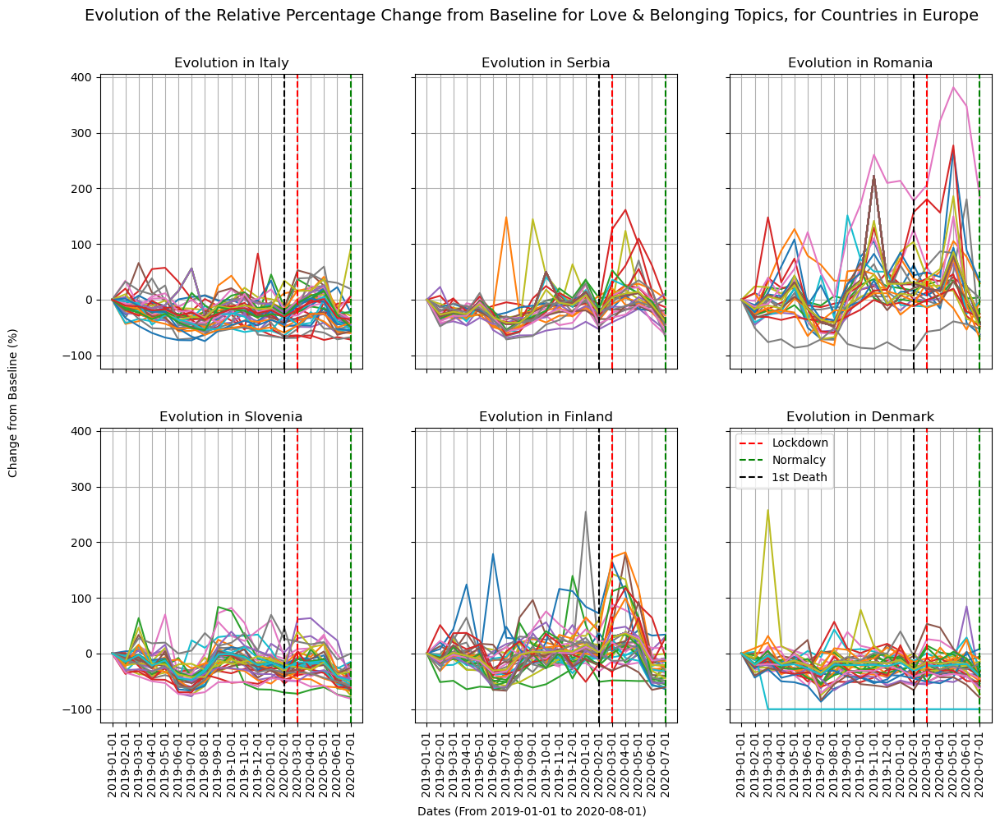

In [76]:
# Step 7)
dfsLoveBaseFiltered = {
        "it": [], 
        "cs": [],
        "ro": [],
        "sv": [],
        "fi": [],
        "da": [],
        }

for i in range(len(lan)) :
        dfFiltered = filter_outlier(dfsLoveBaseline[lan[i]], 600).copy()
        dfsLoveBaseFiltered[lan[i]] = dfFiltered

# Step 8)
plot_df_countries(dfsLoveBaseFiltered, 'Change from Baseline (%)', 
                  'Evolution of the Relative Percentage Change from Baseline for Love & Belonging Topics, for Countries in Europe')

Now we will view the averaging of all the different topics for all countries.

In [77]:
# Step 9)
one_plot_avg_px (dfsLoveBaseFiltered,
 'Evolution of the Average of the Relative Percentage Change from Baseline for Each country for Love & Belonging Topics')

In the above graph, we can see that there seems to be a general trend upwards for most countries straight after the months corresponding to the first covid death as well as the lockdown implementation month. This would seem to indicate that Covid-19 has increased the number of pageviews when it comes to Love & Belonging topics. Now, in order to have a view general of europe through these countries specifically, we'll average out all of the datafarmes together in the code below and observe the results.

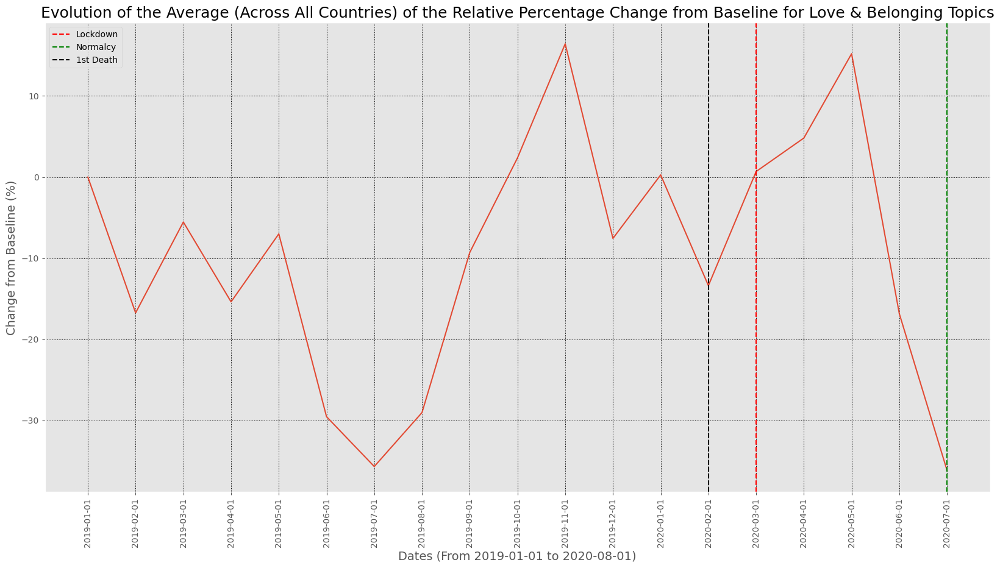

In [48]:
# Step 10)
dfLoveAll = dfsLove['it'].copy()
dfLoveAll = dfLoveAll.iloc[:, [0]]

for key, value in dfsLoveBaseFiltered.items():
    dfLoveAll[key] = value['avg']

dfLoveAll['avg_tot'] = (dfLoveAll.iloc[:, 1:]).mean(axis=1)

title =\
    'Evolution of the Average (Across All Countries) of the Relative Percentage Change from Baseline for Love & Belonging Topics'

plot_df(dfLoveAll[['Timestamp', 'avg_tot']], 'Change from Baseline (%)', title)


In the above plot, this shift upwards seems more prevalent, but in order to have a more conclusive analysis, we will need to perform a differences in differences analysis, which will be done at the end of this section.

### Summary

Self Actualization variables :

In [49]:
# STRUCTURES CONTAINING MULTIPLE DFS
dfsSelf
dfsSelfFiltered
dfsSelfBaseline
dfsSelfBaseFiltered

# DF
dfSelfAll

,Timestamp,it,cs,ro,sv,fi,da,avg_tot
0,2019-01-01,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,2019-02-01,-13.447061,-29.936775,-24.103176,-13.527270,-14.214758,-20.873087,-19.350355
2,2019-03-01,-7.493862,-21.478497,-3.629862,-7.017737,-4.933241,-7.236816,-8.631669
3,2019-04-01,-17.598034,-26.215984,-5.439255,-14.457259,-12.850624,-21.453473,-16.335771
4,2019-05-01,-13.334503,-8.557525,8.279732,-7.272211,-19.398293,-22.736423,-10.503204
5,2019-06-01,-27.757281,-33.518901,-24.749194,-43.413740,-45.559534,-26.624517,-33.603861
6,2019-07-01,-35.421825,-49.623434,-44.042343,-42.347724,-41.953853,-41.970861,-42.560007
7,2019-08-01,-40.579668,-44.722067,-45.244631,-23.857116,-9.747140,-21.689564,-30.973364
8,2019-09-01,-17.941683,-25.620996,-10.084735,-5.296648,-0.455445,-21.325732,-13.454207
9,2019-10-01,-6.768619,18.880408,9.064770,-2.489413,0.407941,-21.511856,-0.402795


Esteem variables :

In [50]:
# STRUCTURES CONTAINING MULTIPLE DFS
dfsEsteem
dfsEsteemFiltered
dfsEsteemBaseline
dfsEsteemBaseFiltered

# DF
dfEsteemAll

,Timestamp,it,cs,ro,sv,fi,da,avg_tot
0,2019-01-01,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,2019-02-01,-13.740610,-27.237407,-20.340233,-14.208581,-13.752647,-20.396746,-18.279371
2,2019-03-01,-7.580403,-17.166909,-0.532884,-6.981218,-1.621804,-5.080677,-6.493982
3,2019-04-01,-17.959170,-17.969193,-7.709664,-17.633087,-11.374048,-18.435240,-15.180067
4,2019-05-01,-11.433263,-6.860066,12.399245,-11.923767,-14.875976,-19.909066,-8.767149
5,2019-06-01,-20.894472,-29.067249,-25.694739,-42.758986,-43.618900,-25.067046,-31.183565
6,2019-07-01,-21.657601,-45.133756,-47.736726,-41.748710,-39.817875,-40.889795,-39.497410
7,2019-08-01,-38.240942,-42.402877,-46.897005,-23.510858,-7.317395,-19.251111,-29.603365
8,2019-09-01,-22.366213,-26.908232,-0.471823,-5.281329,1.615394,-18.991785,-12.067331
9,2019-10-01,-12.379237,-11.624096,26.344556,-5.113516,0.563390,-18.382978,-3.431980


Love & Belonging variables :

In [51]:
# STRUCTURES CONTAINING MULTIPLE DFS
dfsLove
dfsLoveFiltered
dfsLoveBaseline
dfsLoveBaseFiltered

# DF
dfLoveAll

,Timestamp,it,cs,ro,sv,fi,da,avg_tot
0,2019-01-01,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,2019-02-01,-10.630042,-27.061259,-17.191910,-14.858209,-11.271755,-19.483586,-16.749460
2,2019-03-01,-12.172618,-21.681280,5.469033,-2.616051,1.468714,-3.757952,-5.548359
3,2019-04-01,-19.133025,-25.906826,-0.201983,-21.658642,-3.866171,-21.563217,-15.388311
4,2019-05-01,-17.414561,-8.137211,26.173166,-12.497762,-10.687132,-19.485995,-7.008249
5,2019-06-01,-28.204972,-31.604935,-16.039541,-44.159139,-30.521850,-26.815377,-29.557636
6,2019-07-01,-22.427147,-41.382909,-35.783331,-47.466589,-28.703359,-38.442527,-35.700977
7,2019-08-01,-35.623893,-41.563389,-42.463813,-32.142371,-2.540136,-19.945822,-29.046571
8,2019-09-01,-25.590588,-22.543914,11.900519,-1.986383,3.104524,-20.731782,-9.307937
9,2019-10-01,-16.706731,17.910903,33.085223,-1.122683,1.721147,-20.732797,2.359177


Combining Final Averages Plots in one plot

C:\Users\Kamal\AppData\Local\Temp\ipykernel_33988\646712158.py:33: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(labels= dates,rotation=90)
C:\Users\Kamal\AppData\Local\Temp\ipykernel_33988\646712158.py:33: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(labels= dates,rotation=90)
C:\Users\Kamal\AppData\Local\Temp\ipykernel_33988\646712158.py:33: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(labels= dates,rotation=90)


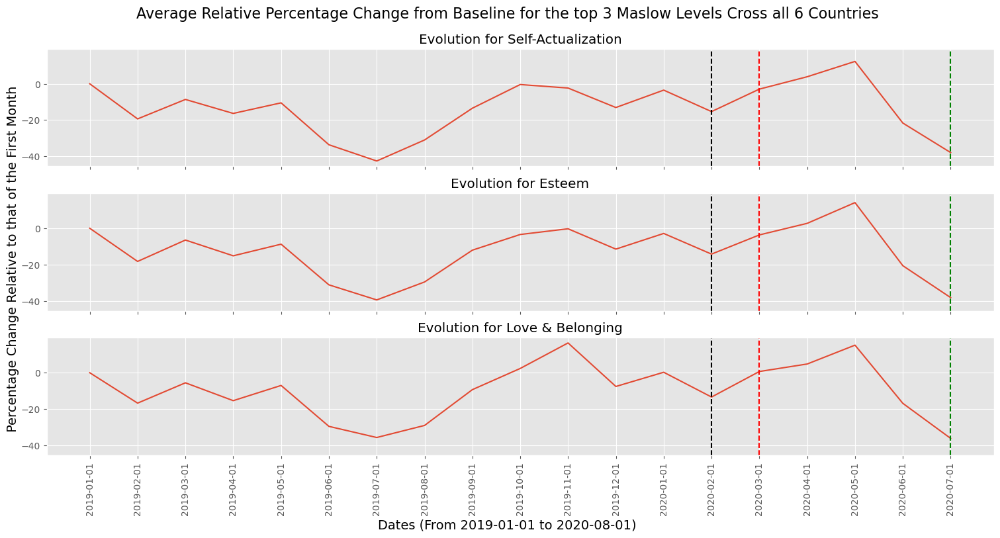

In [52]:
# Get 1st case, lockdown and normalcy dates for vertical lines in the plot
itLockdown = '2020-03-01'
itNormalcy = '2020-07-01'
it1stCase = '2020-02-01'


# Get dates for which we recorded the number of pageviews
dates = dfLoveAll['Timestamp'].values

# Array containing the different maslow dfs
dfsPageviews = [dfSelfAll, dfEsteemAll, dfLoveAll]

# Top 3 levels of maslow's pyramid
levels = ['Self-Actualization', 'Esteem', 'Love & Belonging']

# Figure contains 3x1 (3) subplots, one for each maslow level that we will be analyzing 
fig, axs= plt.subplots(3, 1, sharey=True, sharex=True, figsize=(15,8))

# Iterate over every level
for i, level in enumerate(levels) :

    ax = axs[i]

    # Create lineplot, one for each Maslow level
    sns.lineplot(x=dates, y=dfsPageviews[i]['avg_tot'].values, ax=ax)
    
    # Plotting the vertical lines corresponding to the covid measures
    ax.axvline(x=itLockdown,color='red', linestyle='--', label='Lockdown')
    ax.axvline(x=itNormalcy,color='green', linestyle='--', label='Normalcy')
    ax.axvline(x=it1stCase,color='black', linestyle='--', label='1st Death')


    ax.set_xticklabels(labels= dates,rotation=90)    
    ax.set_title('Evolution for ' + level)
    ax.grid(True)

# Adding general titles to the x and y-axis
fig.text(0.5, 0.00000005, 'Dates (From 2019-01-01 to 2020-08-01)', ha='center',
         va='center', fontsize=14)
fig.text(0.002, 0.5, ' Percentage Change Relative to that of the First Month', ha='center',
         va='center', rotation='vertical', fontsize=14)

# Addjusting figure formatting
plt.tight_layout()
plt.subplots_adjust(top=0.90)

# Adding a general title
plt.suptitle('Average Relative Percentage Change from Baseline for the top 3 Maslow Levels Cross all 6 Countries', fontsize=16)
plt.show()

To conclude this introductory analysis, since all top three Maslow Levels have a general shift upwards after the first death and the first lockown implementation, this seems to suggest that all levels have increased in relevance after Covid-19. If this increase is the same across the board, this would mean that the top of Maslow's pyramid remained intact after Covid-19. However, it may be possible that certain levels have become more important than others, despite the identical behaviour for each level.

We shall now dive into the differences in differences analysis, where we will yield more conclusive results.

**Difference in differences**

In this section we will provide an analysis using the difference in differences method to quantify the changes due to the covid pandemic. Since we are not performing a controlled experiment we do not dispose of a control and treatment group as comparison directly, as the pandemic affected the whole world without exeption. We will therefore use previous temporal periods as a "control" or unaffected group. For the datasets gathered above, we dispose of dates from the start of the year 2019. This enables us to use the early 2019 period as control group, as it can remove year seasonality effect and be used to compare the early 2020 year where covid 19 pandemic hit.

In [53]:
#we rename Timestamp and avg columns for compatibility with the helper functions

dfLoveBaseline = dfLoveAll.rename(columns = {'Timestamp':'Date', 'avg_tot':'Value'})
dfEsteemBaseline = dfEsteemAll.rename(columns = {'Timestamp':'Date', 'avg_tot':'Value'})
dfSelfBaseline = dfSelfAll.rename(columns = {'Timestamp':'Date', 'avg_tot':'Value'})
dfLoveBaseline

,Date,it,cs,ro,sv,fi,da,Value
0,2019-01-01,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,2019-02-01,-10.630042,-27.061259,-17.191910,-14.858209,-11.271755,-19.483586,-16.749460
2,2019-03-01,-12.172618,-21.681280,5.469033,-2.616051,1.468714,-3.757952,-5.548359
3,2019-04-01,-19.133025,-25.906826,-0.201983,-21.658642,-3.866171,-21.563217,-15.388311
4,2019-05-01,-17.414561,-8.137211,26.173166,-12.497762,-10.687132,-19.485995,-7.008249
5,2019-06-01,-28.204972,-31.604935,-16.039541,-44.159139,-30.521850,-26.815377,-29.557636
6,2019-07-01,-22.427147,-41.382909,-35.783331,-47.466589,-28.703359,-38.442527,-35.700977
7,2019-08-01,-35.623893,-41.563389,-42.463813,-32.142371,-2.540136,-19.945822,-29.046571
8,2019-09-01,-25.590588,-22.543914,11.900519,-1.986383,3.104524,-20.731782,-9.307937
9,2019-10-01,-16.706731,17.910903,33.085223,-1.122683,1.721147,-20.732797,2.359177


We will introduce variables, namely 'g' for the group assigned (control or treatment), and t which indicates whether the data considered is before treatment date (lockdown in March) or after. We will also consider the interaction between these two variables g*t. We will then perform a regression on these three variables and the DiD coefficient will be the resulting weight given to the g*t variable.

[  1.81382518 -10.26597634  10.35723958]
[  0.26958731 -12.65172516  12.79960867]
[  0.59062298 -11.08474941  10.49855136]


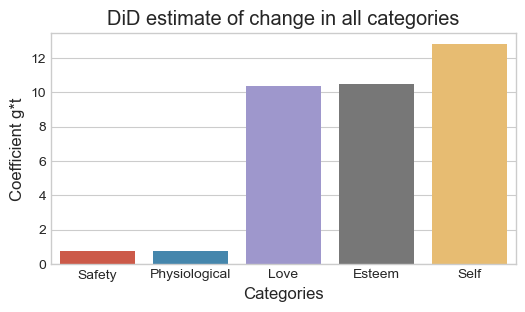

In [148]:

#Define control and treatment groups aswell as remove unwanted columns
dfLoveBaselinem = split_group2(dfLoveBaseline, '2019-01-01', '2019-07-01', '2020-01-01', '2020-07-01', '2019-03-01', '2020-03-01')
dfSelfBaselinem = split_group2(dfSelfBaseline, '2019-01-01', '2019-07-01', '2020-01-01', '2020-07-01', '2019-03-01', '2020-03-01')
dfEsteemBaselinem = split_group2(dfEsteemBaseline, '2019-01-01', '2019-07-01', '2020-01-01', '2020-07-01', '2019-03-01', '2020-03-01')

lr = LinearRegression()
list = [dfLoveBaselinem, dfSelfBaselinem, dfEsteemBaselinem]
Values = []
for df in list:
    X = df[['g', 't', 'gt']]
    y = df.Value
    lr.fit(X, y)
    print(lr.coef_)
    Values.append(lr.coef_[2])
Values.append(np.mean(unemp_values))
Values.append(np.mean(grocery_store+pharmacy))
# Create a new DataFrame for plotting
df_plot = pd.DataFrame({
    'Categories': ['Love', 'Self', 'Esteem','Safety','Physiological'],
    'Values': Values
})
df_plot=df_plot.sort_values(by='Values',ascending=True)
# Create the plot
plt.figure(figsize=(6,3))
sns.barplot(x='Categories', y='Values', data=df_plot)
plt.ylabel('Coefficient g*t')
plt.xlabel('Categories')
plt.title('DiD estimate of change in all categories')
plt.savefig('result.png')
plt.show()

We observe that the pandemic had a high positive effect in terms of pageviews for all three top categories of Maslow's pyramid, with Self-Actualization seeing the highest uprise. Physiological and safety needs were both affected on a smaller scale.
